## IMPORT LIBRARIES

In [1]:
from xverse.ensemble import VotingSelector

In [1]:
import warnings
import pandas as pd
import numpy as np
from datetime import date
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
from matplotlib.patches import Patch
%matplotlib inline

## KONFIGURASI PANDAS DAN PLOT ##
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.option_context("display.max_rows", 100)
rcParams['figure.figsize'] = 12, 5
sns.set_style("darkgrid", {"axes.facecolor": ".9"})
sns.set_context("paper")
sns.set_palette("muted")

warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.option_context("display.max_rows", 100)


pd.options.display.max_columns=999
pd.options.display.max_rows=999

In [2]:
import pandas as pd
import xgboost as xgb
import lime.lime_tabular
from datetime import date
from sklearn import tree
from sklearn import metrics
from collections import defaultdict
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score, classification_report
from sklearn.metrics import roc_auc_score, classification_report, accuracy_score, roc_curve, average_precision_score, precision_recall_curve

In [3]:
from scipy.stats import pearsonr, spearmanr
from scipy.stats import chi2_contingency
from scipy.stats import chi2

## IMPORT DATASET

In [6]:
df_train = pd.read_csv('20210724_dataset_HR_analytics_Codex.csv')
df_train.head()

,Employee_Name,DateofTermination,EmploymentStatus,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,MarriedID_Married,MarriedID_Not married,MaritalStatusID_Divorced,MaritalStatusID_Married,MaritalStatusID_Single,MaritalStatusID_Widowed,GenderID_F,GenderID_M,EmpStatusID_Karyawan Organik,EmpStatusID_Prohire,EmpStatusID_TKP/ Outsource,RoleID_Artificial Intelligent,RoleID_Back End Developer,RoleID_Business Analyst,RoleID_DevOps Engineer,RoleID_Digital Product Manager,RoleID_Front End Developer,RoleID_Mobile Developer Android,RoleID_Mobile Developer iOS,RoleID_Product Owner,RoleID_Scrum Master,RoleID_Software Architect,RoleID_System Documentation,RoleID_UI Designer,RoleID_UX Designer,RoleID_UX Researcher,RoleID_UX Writer,LevelID_Junior,LevelID_Middle,LevelID_Senior,PerfScoreID_Average,PerfScoreID_Exceed,PerfScoreID_Fully meets,PerfScoreID_Need improvement,PerfScoreID_Special treatment,Tribe_COM,Tribe_Com,Tribe_EDU,Tribe_ENT,Tribe_EWD,Tribe_FIN,Tribe_HLT,Tribe_IHL,Tribe_IHX,Tribe_LGT,Tribe_VGA,Squad_AM Performance,Squad_Activate & Install,Squad_Active & Install,Squad_Ads Based,Squad_Arkademy,Squad_Bonum,Squad_ChatAja,Squad_Core Domain,Squad_DTP Com,Squad_Data & Dashboard Analytics,Squad_Delivery & Project Mgt,Squad_Evaluate,Squad_Explore,Squad_GTM,Squad_Get Support,Squad_Get Support\r,Squad_Get Support & Terminated,Squad_HunianAja,Squad_IndiBOX Apps,Squad_IndiBOX STB,Squad_IndiHome Music,Squad_IndiHome Smart,Squad_IndiHome Study,Squad_Inpoin,Squad_Intermoda,Squad_Lead/Reviewer/Maintener,Squad_Logee Port,Squad_Logee Port (Maintainer),Squad_Logee Truck All Product,Squad_Logee Truck Apps,Squad_Logee Truck Web,Squad_MPS,Squad_MyPertamina,Squad_NETMONK,Squad_OCA,Squad_Pay,Squad_Payment - SSOF,Squad_PeduliLindungi,Squad_Platform,Squad_Pre Vaksinasi,Squad_Product & Content Management System,Squad_Progressive Web App,Squad_RPA & Profitability,Squad_Refactoring New IA,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Squad A,Squad_Squad B,Squad_Squad C,Squad_Squad Control Tower,Squad_Squad D,Squad_Squad Pijar Corpu,Squad_Squad Pijar Mahir,Squad_Squad Pijar Sekolah,Squad_Squad Service Core,Squad_UMEETME,Squad_UseeTV Go,Squad_Vaksinasi,Squad_Vutura,RaceDesc_Bali,RaceDesc_Cina,RaceDesc_Jawa,RaceDesc_Padang,RaceDesc_Sunda,TermReason_Another position,TermReason_Fatal attraction,TermReason_Learned that he is a gangster,TermReason_N/A-StillEmployed,TermReason_attendance,TermReason_career change,TermReason_hours,TermReason_maternity leave - did not return,TermReason_medical issues,TermReason_military,TermReason_more money,"TermReason_no-call, no-show",TermReason_performance,TermReason_relocation out of area,TermReason_retiring,TermReason_return to school,TermReason_unhappy,RecruitmentSource_CareerBuilder,RecruitmentSource_Diversity Job Fair,RecruitmentSource_Employee Referral,RecruitmentSource_Google Search,RecruitmentSource_Indeed,RecruitmentSource_LinkedIn,RecruitmentSource_On-line Web application,RecruitmentSource_Other,RecruitmentSource_Website,empSatisfaction_to_Absences,age_when_hire_day,hire_to_review_day,working_time,Absence_to_hire_to_review
0,A Ridwan,2021-07-24,1,4.60,5,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,5.000000,10222,3118,3672,0.000321
1,Ade Setyanto,2018-06-16,0,4.96,3,6,0,17,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.176471,14574,697,1174,0.024390
2,Adhitya Bramantya Ranggatyasta,2014-09-24,0,3.02,3,0,0,3,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [7]:
df_train.EmploymentStatus.value_counts()

1    194
0     93
Name: EmploymentStatus, dtype: int64

In [8]:
df_train = df_train.rename(columns={"EmploymentStatus": "label"})
df_train

,Employee_Name,DateofTermination,label,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,MarriedID_Married,MarriedID_Not married,MaritalStatusID_Divorced,MaritalStatusID_Married,MaritalStatusID_Single,MaritalStatusID_Widowed,GenderID_F,GenderID_M,EmpStatusID_Karyawan Organik,EmpStatusID_Prohire,EmpStatusID_TKP/ Outsource,RoleID_Artificial Intelligent,RoleID_Back End Developer,RoleID_Business Analyst,RoleID_DevOps Engineer,RoleID_Digital Product Manager,RoleID_Front End Developer,RoleID_Mobile Developer Android,RoleID_Mobile Developer iOS,RoleID_Product Owner,RoleID_Scrum Master,RoleID_Software Architect,RoleID_System Documentation,RoleID_UI Designer,RoleID_UX Designer,RoleID_UX Researcher,RoleID_UX Writer,LevelID_Junior,LevelID_Middle,LevelID_Senior,PerfScoreID_Average,PerfScoreID_Exceed,PerfScoreID_Fully meets,PerfScoreID_Need improvement,PerfScoreID_Special treatment,Tribe_COM,Tribe_Com,Tribe_EDU,Tribe_ENT,Tribe_EWD,Tribe_FIN,Tribe_HLT,Tribe_IHL,Tribe_IHX,Tribe_LGT,Tribe_VGA,Squad_AM Performance,Squad_Activate & Install,Squad_Active & Install,Squad_Ads Based,Squad_Arkademy,Squad_Bonum,Squad_ChatAja,Squad_Core Domain,Squad_DTP Com,Squad_Data & Dashboard Analytics,Squad_Delivery & Project Mgt,Squad_Evaluate,Squad_Explore,Squad_GTM,Squad_Get Support,Squad_Get Support\r,Squad_Get Support & Terminated,Squad_HunianAja,Squad_IndiBOX Apps,Squad_IndiBOX STB,Squad_IndiHome Music,Squad_IndiHome Smart,Squad_IndiHome Study,Squad_Inpoin,Squad_Intermoda,Squad_Lead/Reviewer/Maintener,Squad_Logee Port,Squad_Logee Port (Maintainer),Squad_Logee Truck All Product,Squad_Logee Truck Apps,Squad_Logee Truck Web,Squad_MPS,Squad_MyPertamina,Squad_NETMONK,Squad_OCA,Squad_Pay,Squad_Payment - SSOF,Squad_PeduliLindungi,Squad_Platform,Squad_Pre Vaksinasi,Squad_Product & Content Management System,Squad_Progressive Web App,Squad_RPA & Profitability,Squad_Refactoring New IA,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Squad A,Squad_Squad B,Squad_Squad C,Squad_Squad Control Tower,Squad_Squad D,Squad_Squad Pijar Corpu,Squad_Squad Pijar Mahir,Squad_Squad Pijar Sekolah,Squad_Squad Service Core,Squad_UMEETME,Squad_UseeTV Go,Squad_Vaksinasi,Squad_Vutura,RaceDesc_Bali,RaceDesc_Cina,RaceDesc_Jawa,RaceDesc_Padang,RaceDesc_Sunda,TermReason_Another position,TermReason_Fatal attraction,TermReason_Learned that he is a gangster,TermReason_N/A-StillEmployed,TermReason_attendance,TermReason_career change,TermReason_hours,TermReason_maternity leave - did not return,TermReason_medical issues,TermReason_military,TermReason_more money,"TermReason_no-call, no-show",TermReason_performance,TermReason_relocation out of area,TermReason_retiring,TermReason_return to school,TermReason_unhappy,RecruitmentSource_CareerBuilder,RecruitmentSource_Diversity Job Fair,RecruitmentSource_Employee Referral,RecruitmentSource_Google Search,RecruitmentSource_Indeed,RecruitmentSource_LinkedIn,RecruitmentSource_On-line Web application,RecruitmentSource_Other,RecruitmentSource_Website,empSatisfaction_to_Absences,age_when_hire_day,hire_to_review_day,working_time,Absence_to_hire_to_review
0,A Ridwan,2021-07-24,1,4.60,5,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,5.000000,10222,3118,3672,0.000321
1,Ade Setyanto,2018-06-16,0,4.96,3,6,0,17,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.176471,14574,697,1174,0.024390
2,Adhitya Bramantya Ranggatyasta,2014-09-24,0,3.02,3,0,0,3,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,

## FEATURE SELECTION

In [25]:
#split data into independent features and target 
X = df_train.drop('label',axis = 1)
y = df_train.label

In [6]:
'''
# Create correlation matrix
corr_matrix = df_train.corr()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.975)]

print(f'There are {len(to_drop)} correlated columns to remove.')
print(to_drop)
'''

"\n# Create correlation matrix\ncorr_matrix = df_train.corr()\n\n# Select upper triangle of correlation matrix\nupper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))\n\n# Find index of feature columns with correlation greater than 0.95\nto_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.975)]\n\nprint(f'There are {len(to_drop)} correlated columns to remove.')\nprint(to_drop)\n"

In [56]:
#df_train.isnull().sum()

phoneno                     0
device_used                 0
device_used_nan             0
login_attempt               0
last_used_cnt               0
most_used_cnt               0
login_attempt_l1h           0
login_attempt_l3h           0
login_attempt_l6h           0
login_attempt_l12h          0
login_attempt_l1d           0
login_attempt_l2d           0
login_attempt_l3d           0
last_used_cnt_l1h           0
last_used_cnt_l3h           0
last_used_cnt_l6h           0
last_used_cnt_l12h          0
last_used_cnt_l1d           0
last_used_cnt_l2d           0
last_used_cnt_l3d           0
diff_last_device_l1h        0
diff_last_device_l3h        0
diff_last_device_l6h        0
diff_last_device_l12h       0
diff_last_device_l1d        0
diff_last_device_l2d        0
diff_last_device_l3d        0
most_used_cnt_l1h           0
most_used_cnt_l3h           0
most_used_cnt_l6h           0
most_used_cnt_l12h          0
most_used_cnt_l1d           0
most_used_cnt_l2d           0
most_used_

In [9]:
# call Votingselector with minimum_votes of 2 
#clf = VotingSelector(minimum_votes=2)
#clf.fit(X, y)

In [ ]:
#show important features 
#clf.feature_importances_

In [12]:
#show important features 
#clf.feature_importances_.iloc[:30,:]

,Variable_Name,Information_Value,Random_Forest,Recursive_Feature_Elimination,Extra_Trees,Chi_Square,L_One
0,total_freq_debit_6bln,0.978250,0.019581,0.000000e+00,0.012817,0.283411,-1.294084e-04
1,total_amt_debit_6bln,0.910444,0.033281,7.278892e-08,0.012812,0.474618,-1.581987e-09
2,total_amt_credit_6bln,0.910444,0.048826,-1.069130e-07,0.014657,0.694958,-3.145517e-09
3,total_hari_debit_6bln,0.910444,0.021587,0.000000e+00,0.017720,10.122727,7.988240e-03
4,Max_ratas_last6bln,0.910444,0.016993,-9.740528e-08,0.008295,1.705605,-2.560647e-08
5,Q3_Delay_amt_Credit_6bln,0.896272,0.037613,7.582510e-08,0.026342,21.076764,6.422830e-08
6,Q1_Delay_amt_Debit_3bln,0.879435,0.007764,-4.516089e-07,0.009558,2.454611,-7.994677e-07
7,Q1_Delay_freq_Debit_6bln,0.852962,0.006868,0.000000e+00,0.009890,0.272736,1.240838e-02
8,total_ratas_saldo_last_month6,0.848998,0.014329,1.742968e-07,0.008723,1.590955,4.756859e-08
9,Q1_Delay_freq_Debit_3bln,0.836284,0.007030,0.000000e+00,0.012112,0.523760,0.000000e+00


In [13]:
# votes 
clf.feature_votes_.iloc[:40, :]

,Variable_Name,Information_Value,Random_Forest,Recursive_Feature_Elimination,Extra_Trees,Chi_Square,L_One,Votes
37,Q3_Delay_amt_Debit_3bln,1,1,1,1,1,1,6
8,total_ratas_saldo_last_month6,1,1,1,1,1,1,6
23,total_ratas_saldo_last_month5,1,1,1,1,1,1,6
24,Rata2_Saldo_3bln,1,1,1,1,1,1,6
41,Q1_Delay_amt_Credit_3bln,1,1,1,1,1,1,6
39,Q3_Delay_amt_Credit_3bln,1,1,1,1,1,1,6
10,Q1_Delay_amt_Credit_6bln,1,1,1,1,1,1,6
6,Q1_Delay_amt_Debit_3bln,1,1,1,1,1,1,6
5,Q3_Delay_amt_Credit_6bln,1,1,1,1,1,1,6
4,Max_ratas_last6bln,1,1,1,1,1,1,6


In [14]:
# votes 
clf.feature_votes_.iloc[40:, :]

,Variable_Name,Information_Value,Random_Forest,Recursive_Feature_Elimination,Extra_Trees,Chi_Square,L_One,Votes
18,total_hari_debit_3bln,1,1,0,1,1,0,4
11,Q3_Delay_freq_Debit_3bln,1,1,0,1,0,1,4
12,Max_cbal_base_last6bln,1,1,1,0,1,0,4
14,Q2_Delay_freq_Debit_3bln,1,1,0,1,0,1,4
31,total_cbal_base_last_month2,1,1,1,0,0,1,4
...,...,...,...,...,...,...,...,...
83,total_freq_credit_last_month1,0,0,0,0,0,0,0
64,total_freq_debit_last_month3,0,0,0,0,0,0,0
67,total_freq_debit_last_month2,0,0,0,0,0,0,0
76,Min_freq_debit_last6Bln,0,0,0,0,0,0,0


In [15]:
X_new = clf.transform(X)

In [16]:
fitur_vote = X_new.columns.to_list()

In [17]:
fitur_vote

['Q3_Delay_amt_Debit_3bln',
 'total_ratas_saldo_last_month6',
 'total_ratas_saldo_last_month5',
 'Rata2_Saldo_3bln',
 'Q1_Delay_amt_Credit_3bln',
 'Q3_Delay_amt_Credit_3bln',
 'Q1_Delay_amt_Credit_6bln',
 'Q1_Delay_amt_Debit_3bln',
 'Q3_Delay_amt_Credit_6bln',
 'Max_ratas_last6bln',
 'total_cbal_base_last_month4',
 'Q2_Delay_amt_Credit_6bln',
 'Q2_Delay_amt_Debit_3bln',
 'Usia',
 'Q2_Delay_amt_Credit_3bln',
 'Q2_Delay_amt_Debit_6bln',
 'total_ratas_saldo_last_month4',
 'total_cbal_base_last_month1',
 'total_ratas_saldo_last_month1',
 'total_ratas_saldo_last_month2',
 'Min_cbal_base_last6bln',
 'Rata2_Ratas_Saldo_6bln',
 'Q3_Delay_amt_Debit_6bln',
 'total_cbal_base_last_month3',
 'total_amt_credit_3bln',
 'total_cbal_base_last_month6',
 'Rata2_Ratas_Saldo_3bln',
 'total_hari_credit_6bln',
 'Max_amt_credit_last6Bln',
 'Max_amt_debit_last6Bln',
 'total_hari_debit_6bln',
 'total_amt_credit_6bln',
 'jenis_pekerjaan_UNDEFINED',
 'total_amt_debit_3bln',
 'Q3_Delay_freq_Credit_6bln',
 'Q1_Dela

## Information Value

In [9]:
def get_information_values(data, target, bins=10, show_woe=False):
    
    #Empty Dataframe
    data_iv, data_woe = pd.DataFrame(), pd.DataFrame()
    
    #Extract Column Names
    cols = data.columns
    
    #Run WOE and IV on all the independent variables
    for ivars in cols[~cols.isin([target])]:
        if (data[ivars].dtype.kind in 'bifc') and (len(np.unique(data[ivars]))>10):
            binned_x = pd.qcut(data[ivars], bins,  duplicates='drop')
            d0 = pd.DataFrame({'x': binned_x, 'y': data[target]})
        else:
            d0 = pd.DataFrame({'x': data[ivars], 'y': data[target]})
        d = d0.groupby("x", as_index=False).agg({"y": ["count", "sum"]})
        d.columns = ['Cutoff', 'N', 'Events']
        d['% of Events'] = np.maximum(d['Events'], 0.5) / d['Events'].sum()
        d['Non-Events'] = d['N'] - d['Events']
        d['% of Non-Events'] = np.maximum(d['Non-Events'], 0.5) / d['Non-Events'].sum()
        d['WoE'] = np.log(d['% of Events']/d['% of Non-Events'])
        d['IV'] = d['WoE'] * (d['% of Events'] - d['% of Non-Events'])
        d.insert(loc=0, column='Variable', value=ivars)
        print("Information value of " + ivars + " is " + str(round(d['IV'].sum(),6)))
        temp = pd.DataFrame({"Variable" : [ivars], "IV" : [d['IV'].sum()]}, columns = ["Variable", "IV"])
        data_iv = pd.concat([data_iv, temp], axis=0)
        data_woe = pd.concat([data_woe, d], axis=0)

        #Show WOE Table
        if show_woe == True:
            print(d)

    return data_iv, data_woe

In [10]:
iv_res, woe_res = get_information_values(df_train, target='label')

Information value of Employee_Name is 1.087841
Information value of DateofTermination is 6.401291
Information value of EngagementSurvey is 0.128139
Information value of EmpSatisfaction is 0.094983
Information value of SpecialProjectsCount is 0.183715
Information value of DaysLateLast30 is 0.171997
Information value of Absences is 0.139157
Information value of MarriedID_Married is 0.0031
Information value of MarriedID_Not married is 0.0031
Information value of MaritalStatusID_Divorced is 0.001085
Information value of MaritalStatusID_Married is 0.007581
Information value of MaritalStatusID_Single is 0.0031
Information value of MaritalStatusID_Widowed is 0.002583
Information value of GenderID_F is 0.001442
Information value of GenderID_M is 0.001442
Information value of EmpStatusID_Karyawan Organik is 0.050453
Information value of EmpStatusID_Prohire is 0.000214
Information value of EmpStatusID_TKP/ Outsource is 0.002357
Information value of RoleID_Artificial Intelligent is 0.004148
Infor

In [15]:
iv_res.sort_values(by='IV')

,Variable,IV
0,Squad_Product & Content Management System,0.000019
0,Squad_NETMONK,0.000019
0,RaceDesc_Bali,0.000022
0,RoleID_Software Architect,0.000036
0,Squad_Get Support\r,0.000036
0,Squad_IndiHome Music,0.000036
0,Squad_IndiHome Study,0.000036
0,RoleID_UX Researcher,0.000036
0,Squad_Lead/Reviewer/Maintener,0.000036
0,Squad_Arkademy,0.000036


In [16]:
iv_res.Variable.tolist()

['Employee_Name',
 'DateofTermination',
 'EngagementSurvey',
 'EmpSatisfaction',
 'SpecialProjectsCount',
 'DaysLateLast30',
 'Absences',
 'MarriedID_Married',
 'MarriedID_Not married',
 'MaritalStatusID_Divorced',
 'MaritalStatusID_Married',
 'MaritalStatusID_Single',
 'MaritalStatusID_Widowed',
 'GenderID_F',
 'GenderID_M',
 'EmpStatusID_Karyawan Organik',
 'EmpStatusID_Prohire',
 'EmpStatusID_TKP/ Outsource',
 'RoleID_Artificial Intelligent',
 'RoleID_Back End Developer',
 'RoleID_Business Analyst',
 'RoleID_DevOps Engineer',
 'RoleID_Digital Product Manager',
 'RoleID_Front End Developer',
 'RoleID_Mobile Developer Android',
 'RoleID_Mobile Developer iOS',
 'RoleID_Product Owner',
 'RoleID_Scrum Master',
 'RoleID_Software Architect',
 'RoleID_System Documentation',
 'RoleID_UI Designer',
 'RoleID_UX Designer',
 'RoleID_UX Researcher',
 'RoleID_UX Writer',
 'LevelID_Junior',
 'LevelID_Middle',
 'LevelID_Senior',
 'PerfScoreID_Average',
 'PerfScoreID_Exceed',
 'PerfScoreID_Fully meet

In [17]:
iv_res.sort_values('IV', ascending=False)['Variable'].to_list()

['TermReason_N/A-StillEmployed',
 'DateofTermination',
 'hire_to_review_day',
 'working_time',
 'Absence_to_hire_to_review',
 'Employee_Name',
 'TermReason_Another position',
 'TermReason_unhappy',
 'TermReason_more money',
 'TermReason_career change',
 'RecruitmentSource_Google Search',
 'TermReason_attendance',
 'TermReason_hours',
 'empSatisfaction_to_Absences',
 'SpecialProjectsCount',
 'DaysLateLast30',
 'TermReason_return to school',
 'Absences',
 'age_when_hire_day',
 'EngagementSurvey',
 'RecruitmentSource_Website',
 'TermReason_relocation out of area',
 'Squad_RPA & Profitability',
 'TermReason_performance',
 'TermReason_military',
 'EmpSatisfaction',
 'RecruitmentSource_LinkedIn',
 'RoleID_Scrum Master',
 'TermReason_no-call, no-show',
 'TermReason_medical issues',
 'TermReason_retiring',
 'RecruitmentSource_Diversity Job Fair',
 'Tribe_FIN',
 'Tribe_EDU',
 'Squad_Inpoin',
 'RecruitmentSource_Employee Referral',
 'RecruitmentSource_Indeed',
 'Tribe_HLT',
 'Squad_HunianAja',
 

In [18]:
woe_res.groupby('Variable').agg('sum').to_csv('iv_and_woe_456_filtered.csv', index=True)

In [26]:
iv_res[(iv_res.IV <= 0.5) & (iv_res.IV >= 0.02)].sort_values('IV', ascending=False)

,Variable,IV
0,TermReason_more money,0.457601
0,TermReason_career change,0.300447
0,RecruitmentSource_Google Search,0.255204
0,TermReason_attendance,0.251174
0,TermReason_hours,0.251174
0,empSatisfaction_to_Absences,0.250213
0,SpecialProjectsCount,0.183715
0,DaysLateLast30,0.171997
0,TermReason_return to school,0.158467
0,Absences,0.139157


### FITUR 1

#### 0.02 <= IV <= 0.5

In [34]:
iv_res1 = iv_res[(iv_res.IV <= 0.5) & (iv_res.IV >= 0.02)].set_index('Variable')

In [35]:
list_fitur_1 = iv_res1.sort_values('IV', ascending=False).T.columns.to_list()

In [36]:
list_fitur_1

['TermReason_more money',
 'TermReason_career change',
 'RecruitmentSource_Google Search',
 'TermReason_attendance',
 'TermReason_hours',
 'empSatisfaction_to_Absences',
 'SpecialProjectsCount',
 'DaysLateLast30',
 'TermReason_return to school',
 'Absences',
 'age_when_hire_day',
 'EngagementSurvey',
 'RecruitmentSource_Website',
 'TermReason_military',
 'Squad_RPA & Profitability',
 'TermReason_relocation out of area',
 'TermReason_performance',
 'EmpSatisfaction',
 'RecruitmentSource_LinkedIn',
 'TermReason_retiring',
 'RoleID_Scrum Master',
 'TermReason_medical issues',
 'TermReason_no-call, no-show',
 'RecruitmentSource_Diversity Job Fair',
 'Tribe_FIN',
 'Tribe_EDU',
 'Squad_Inpoin',
 'RecruitmentSource_Employee Referral',
 'RecruitmentSource_Indeed',
 'Tribe_HLT',
 'EmpStatusID_Karyawan Organik',
 'Squad_HunianAja',
 'Squad_Pay',
 'Squad_PeduliLindungi',
 'Squad_IndiBOX Apps',
 'TermReason_maternity leave - did not return',
 'Squad_ChatAja',
 'Squad_Squad Service Core',
 'Squad_M

## FITUR 2

#### IV 0.1 < IV <= 0.5

In [37]:
iv_res2 = iv_res[(iv_res.IV <= 0.5) & (iv_res.IV > 0.1)].set_index('Variable')

In [38]:
list_fitur_2 = iv_res2.sort_values('IV', ascending=False).T.columns.to_list()

In [39]:
list_fitur_2

['TermReason_more money',
 'TermReason_career change',
 'RecruitmentSource_Google Search',
 'TermReason_attendance',
 'TermReason_hours',
 'empSatisfaction_to_Absences',
 'SpecialProjectsCount',
 'DaysLateLast30',
 'TermReason_return to school',
 'Absences',
 'age_when_hire_day',
 'EngagementSurvey',
 'RecruitmentSource_Website',
 'TermReason_relocation out of area',
 'TermReason_performance',
 'Squad_RPA & Profitability',
 'TermReason_military']

## FITUR 3

#### IV 0.3 < IV <= 0.5

In [24]:
iv_res3 = iv_res[(iv_res.IV <= 0.5) & (iv_res.IV > 0.3)].set_index('Variable')

In [25]:
list_fitur_3 = iv_res3.sort_values('IV', ascending=False).T.columns.to_list()

In [26]:
list_fitur_3

['min_saldol1m', 'credit_amtl1m', 'debit_amtl1m']

In [27]:
#df_iv = pd.read_csv('../output_iv.csv')

df_iv = iv_res[(iv_res.IV <= 0.5) & (iv_res.IV > 0.02)].sort_values('IV', ascending=False)

In [28]:
len(iv_res3)

3

In [29]:
df_iv = df_iv[(df_iv.IV < 0.5) & (df_iv.IV >= 0.1)]

In [30]:
def bar_iv():
    fig, ax = plt.subplots(figsize=(20,10))
    sns.barplot(x='IV', y='Variable',data=df_iv.sort_values('IV', ascending=False).reset_index(), orient='h',palette='YlGn_r')
    plt.xlabel('Information Value')
    plt.ylabel('Features')
    ax.yaxis.label.set_size(10)
    ax.xaxis.label.set_size(10)

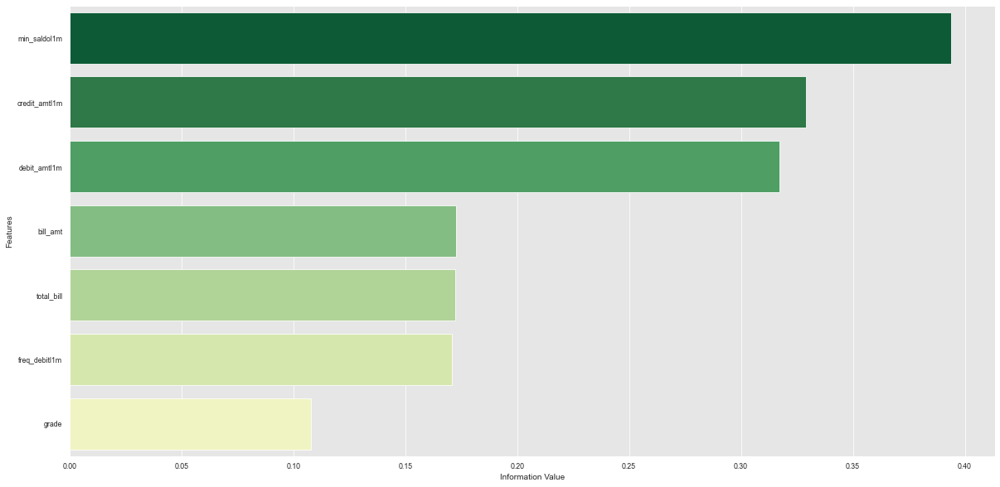

In [31]:
bar_iv()

In [35]:
amt_all = ['total_amt_debit_last_month1',
 'total_amt_credit_last_month1',
    'total_amt_debit_last_month2',
 'total_amt_credit_last_month2',
'total_amt_debit_last_month3',
 'total_amt_credit_last_month3',
    'total_amt_debit_last_month4',
 'total_amt_credit_last_month4',
'total_amt_debit_last_month5',
 'total_amt_credit_last_month5',
    'total_amt_debit_last_month6',
 'total_amt_credit_last_month6', 'Flag']

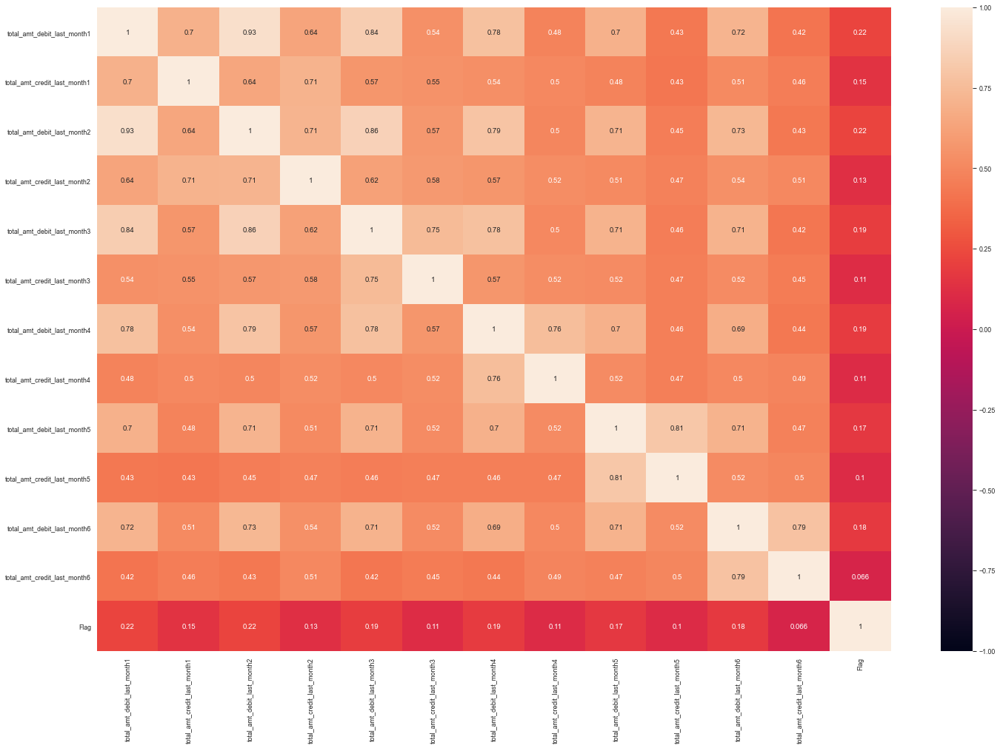

In [36]:
fig, ax = plt.subplots(figsize=(24,16))
sns.heatmap(df_train[amt_all].corr(method='spearman'), vmin=-1, vmax=1, annot=True)
plt.show()

In [37]:
frek_all = ['total_freq_debit_last_month1',
 'total_freq_credit_last_month1',
    'total_freq_debit_last_month2',
 'total_freq_credit_last_month2',
'total_freq_debit_last_month3',
 'total_freq_credit_last_month3',
    'total_freq_debit_last_month4',
 'total_freq_credit_last_month4',
'total_freq_debit_last_month5',
 'total_freq_credit_last_month5',
    'total_freq_debit_last_month6',
 'total_freq_credit_last_month6', 'Flag']

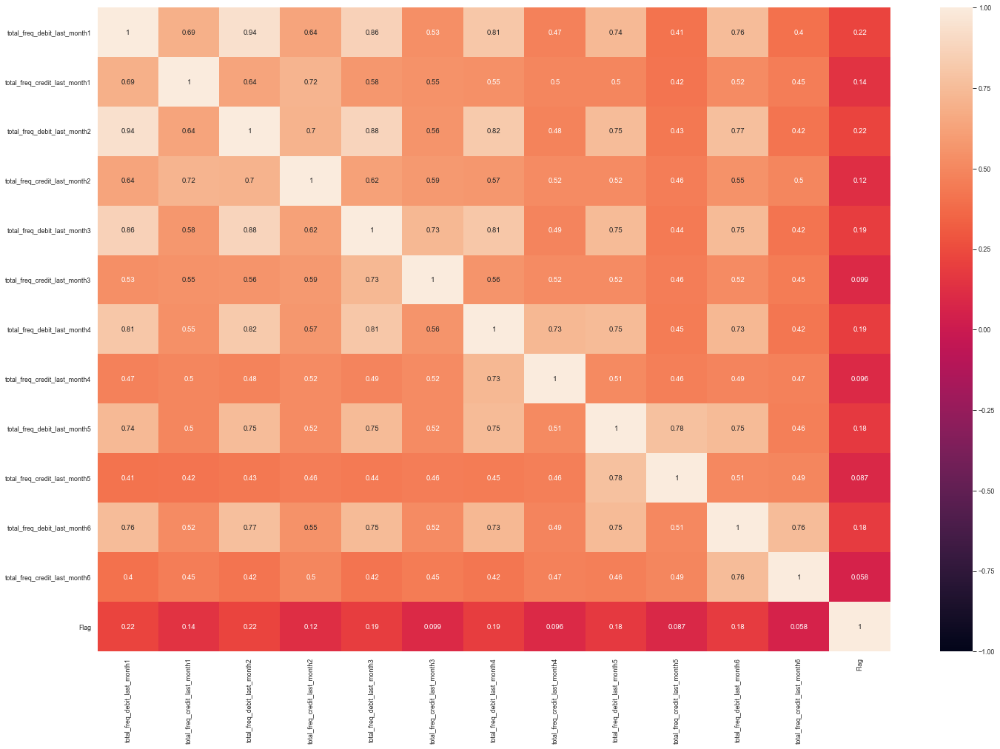

In [38]:
fig, ax = plt.subplots(figsize=(24,16))
sns.heatmap(df_train[frek_all].corr(method='spearman'), vmin=-1, vmax=1, annot=True)
plt.show()

In [39]:
saldo_all = ['total_cbal_base_last_month1',
 'total_ratas_saldo_last_month1','total_cbal_base_last_month2',
 'total_ratas_saldo_last_month2','total_cbal_base_last_month3',
 'total_ratas_saldo_last_month3','total_cbal_base_last_month4',
 'total_ratas_saldo_last_month4','total_cbal_base_last_month5',
 'total_ratas_saldo_last_month5','total_cbal_base_last_month6',
 'total_ratas_saldo_last_month6','Flag']

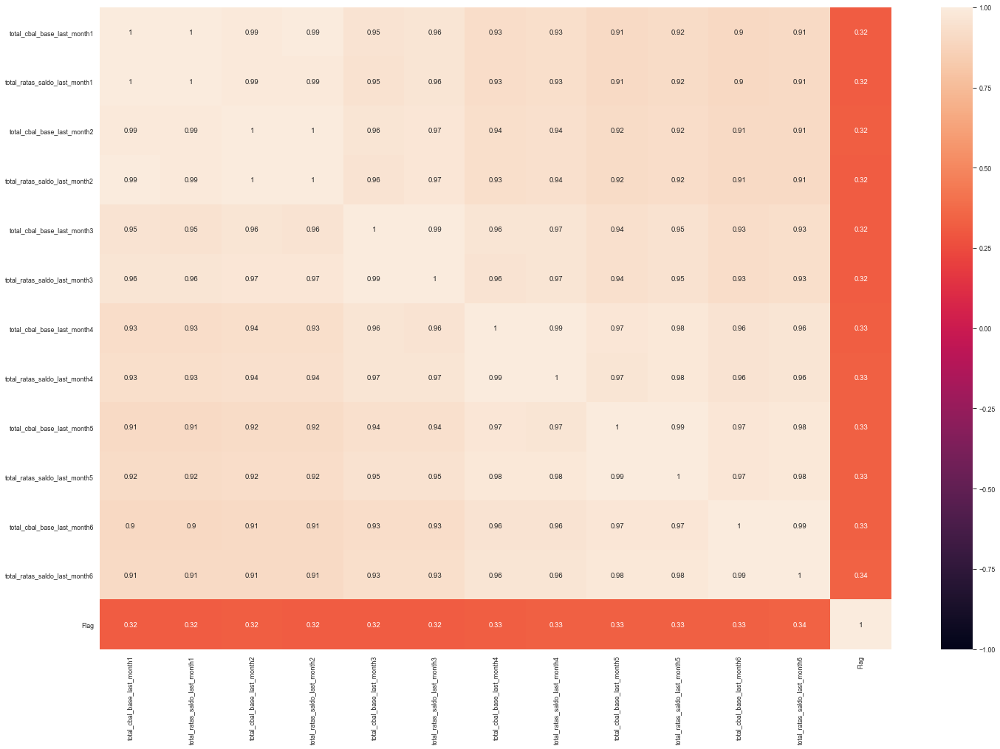

In [40]:
fig, ax = plt.subplots(figsize=(24,16))
sns.heatmap(df_train[saldo_all].corr(method='spearman'), vmin=-1, vmax=1, annot=True)
plt.show()

# Feature selection yg baru dari sini (feature tools)

## Correlation

In [27]:
def cross_corr_mean(df_input, corr_coeff, savefile=1):
    """ The function retuns a list of features to be dropped from the input features.
    
    INPUTS:
    1. df_input: n input features (pandas dataframe)
    2. corr_coeff: Coefficient threshold (absolute value, no negatives) for a pair of variables above which one of the two will be dropped
    3. plot: If set to 1 a plot will be displayed showing a heatmap of the cross-correlation between variables 
    4. savefile: If set to 1, all relevant files will be saved
    
    PLEASE NOTE:
    - The dataframe df_input (should contain only the n input features i.e. no ID and targets) 
    
    SUMMARY OF LOGIC:
    1. The n input variables are taken and a n X n matrix of correlation is created (these are absolute values i.e. a correlation of -0.8 is treated as 0.8)
    2. Variable pairs with correlation higher than the corr_coeff threshold are picked and one of the two variables will be dropped
    3. Which of the two will be dropped is based on the one having lower mean absolute correlation with all other variables 

    SAVED FILES:
    If savefile is set to 1. Saved under current directory under cross_corr_target under folder with a UTC timestamp.
    1. A PDF heatmap representing the cross correlation between all the input features
    2. A CSV of the matrix containing the values used for the heatmap
    3. A CSV of the list of variables to be dropped
    """
        # Pre-processing
    import pandas as pd
    if savefile == 1:
        from datetime import datetime
        time = str(datetime.utcnow())
        import os
        path = str(os.getcwd()) + "/cross_corr_mean/" + str(time[0:19].replace(':',"-")) + "/"
        os.makedirs(path)

    # Generating correlation matrix of input features
    corr_matrix = df_input.corr(method = 'spearman') # For more info on the methods please refer to https://www.kaggle.com/kiyoung1027/correlation-pearson-spearman-and-kendall

    # Generating correlation with the target
    corr_mean = (np.abs(corr_matrix)).mean()

    # Saving files
    if savefile == 1:
        corr_matrix.to_csv(path + "cross_corr.csv")
        corr_mean.to_csv(path + "corr_abs_mean.csv")

    # Preparing data
    features_drop_list = [] # This will contain the list of features to be dropped
    features_index_drop_list = [] # This will contain the index of features to be dropped as per df_input
    corr_matrix = np.abs(corr_matrix)

    # Selecting features to be dropped (Using two for loops that runs on one triangle of the corr_matrix to avoid checking the correlation of a variable with itself)
    for i in range(corr_matrix.shape[0]):
        for j in range(i+1,corr_matrix.shape[0]):

            # The following if statement checks if each correlation value is higher than threshold (or equal) and also ensures the two columns have NOT been dropped already.  
            if corr_matrix.iloc[i,j]>corr_coeff and i not in features_index_drop_list and j not in features_index_drop_list:
            
                # The following if statement checks which of the 2 variables with high correlation has a lower correlation with target and then drops it. If equal we can drop any and it drops the first one (This is arbitrary)
                if corr_mean[corr_matrix.columns[i]] >= corr_mean[corr_matrix.columns[j]]:
                    features_drop_list.append(corr_matrix.columns[i])	# Name of variable that needs to be dropped appended to list
                    features_index_drop_list.append(i)	# Index of variable that needs to be dropped appended to list. This is used to not check for the same variables repeatedly
                else:
                    features_drop_list.append(corr_matrix.columns[j])
                    features_index_drop_list.append(j)
    # Saving final list
    if savefile ==1:
        pd.Series(features_drop_list).to_csv(path + "features_drop_list.csv")

    return features_drop_list

In [28]:
df_train.head()

,Employee_Name,DateofTermination,label,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,MarriedID_Married,MarriedID_Not married,MaritalStatusID_Divorced,MaritalStatusID_Married,MaritalStatusID_Single,MaritalStatusID_Widowed,GenderID_F,GenderID_M,EmpStatusID_Karyawan Organik,EmpStatusID_Prohire,EmpStatusID_TKP/ Outsource,RoleID_Artificial Intelligent,RoleID_Back End Developer,RoleID_Business Analyst,RoleID_DevOps Engineer,RoleID_Digital Product Manager,RoleID_Front End Developer,RoleID_Mobile Developer Android,RoleID_Mobile Developer iOS,RoleID_Product Owner,RoleID_Scrum Master,RoleID_Software Architect,RoleID_System Documentation,RoleID_UI Designer,RoleID_UX Designer,RoleID_UX Researcher,RoleID_UX Writer,LevelID_Junior,LevelID_Middle,LevelID_Senior,PerfScoreID_Average,PerfScoreID_Exceed,PerfScoreID_Fully meets,PerfScoreID_Need improvement,PerfScoreID_Special treatment,Tribe_COM,Tribe_Com,Tribe_EDU,Tribe_ENT,Tribe_EWD,Tribe_FIN,Tribe_HLT,Tribe_IHL,Tribe_IHX,Tribe_LGT,Tribe_VGA,Squad_AM Performance,Squad_Activate & Install,Squad_Active & Install,Squad_Ads Based,Squad_Arkademy,Squad_Bonum,Squad_ChatAja,Squad_Core Domain,Squad_DTP Com,Squad_Data & Dashboard Analytics,Squad_Delivery & Project Mgt,Squad_Evaluate,Squad_Explore,Squad_GTM,Squad_Get Support,Squad_Get Support\r,Squad_Get Support & Terminated,Squad_HunianAja,Squad_IndiBOX Apps,Squad_IndiBOX STB,Squad_IndiHome Music,Squad_IndiHome Smart,Squad_IndiHome Study,Squad_Inpoin,Squad_Intermoda,Squad_Lead/Reviewer/Maintener,Squad_Logee Port,Squad_Logee Port (Maintainer),Squad_Logee Truck All Product,Squad_Logee Truck Apps,Squad_Logee Truck Web,Squad_MPS,Squad_MyPertamina,Squad_NETMONK,Squad_OCA,Squad_Pay,Squad_Payment - SSOF,Squad_PeduliLindungi,Squad_Platform,Squad_Pre Vaksinasi,Squad_Product & Content Management System,Squad_Progressive Web App,Squad_RPA & Profitability,Squad_Refactoring New IA,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Squad A,Squad_Squad B,Squad_Squad C,Squad_Squad Control Tower,Squad_Squad D,Squad_Squad Pijar Corpu,Squad_Squad Pijar Mahir,Squad_Squad Pijar Sekolah,Squad_Squad Service Core,Squad_UMEETME,Squad_UseeTV Go,Squad_Vaksinasi,Squad_Vutura,RaceDesc_Bali,RaceDesc_Cina,RaceDesc_Jawa,RaceDesc_Padang,RaceDesc_Sunda,TermReason_Another position,TermReason_Fatal attraction,TermReason_Learned that he is a gangster,TermReason_N/A-StillEmployed,TermReason_attendance,TermReason_career change,TermReason_hours,TermReason_maternity leave - did not return,TermReason_medical issues,TermReason_military,TermReason_more money,"TermReason_no-call, no-show",TermReason_performance,TermReason_relocation out of area,TermReason_retiring,TermReason_return to school,TermReason_unhappy,RecruitmentSource_CareerBuilder,RecruitmentSource_Diversity Job Fair,RecruitmentSource_Employee Referral,RecruitmentSource_Google Search,RecruitmentSource_Indeed,RecruitmentSource_LinkedIn,RecruitmentSource_On-line Web application,RecruitmentSource_Other,RecruitmentSource_Website,empSatisfaction_to_Absences,age_when_hire_day,hire_to_review_day,working_time,Absence_to_hire_to_review
0,A Ridwan,2021-07-24,1,4.60,5,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,5.000000,10222,3118,3672,0.000321
1,Ade Setyanto,2018-06-16,0,4.96,3,6,0,17,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0.176471,14574,697,1174,0.024390
2,Adhitya Bramantya Ranggatyasta,2014-09-24,0,3.02,3,0,0,3,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,

In [29]:
#list_vote = fitur_vote
#list_vote.append('Flag')

In [30]:
to_drop=['Employee_Name','DateofTermination']
df_corr = df_train.drop(columns = to_drop, axis=1)

In [31]:
correlation_vote = cross_corr_mean(df_corr, corr_coeff=0.9, savefile=1)

In [32]:
df_corr['label'] = df_train['label']
df_selected_features_vote = df_corr.drop(columns=correlation_vote)
selected_features_vote = df_selected_features_vote.columns.to_list()[:-1]

In [33]:
selected_features_vote

['EngagementSurvey',
 'EmpSatisfaction',
 'SpecialProjectsCount',
 'DaysLateLast30',
 'Absences',
 'MaritalStatusID_Divorced',
 'MaritalStatusID_Married',
 'MaritalStatusID_Single',
 'MaritalStatusID_Widowed',
 'GenderID_M',
 'EmpStatusID_Karyawan Organik',
 'EmpStatusID_Prohire',
 'RoleID_Artificial Intelligent',
 'RoleID_Back End Developer',
 'RoleID_Business Analyst',
 'RoleID_DevOps Engineer',
 'RoleID_Digital Product Manager',
 'RoleID_Front End Developer',
 'RoleID_Mobile Developer Android',
 'RoleID_Mobile Developer iOS',
 'RoleID_Product Owner',
 'RoleID_Scrum Master',
 'RoleID_Software Architect',
 'RoleID_System Documentation',
 'RoleID_UI Designer',
 'RoleID_UX Designer',
 'RoleID_UX Researcher',
 'RoleID_UX Writer',
 'LevelID_Junior',
 'LevelID_Middle',
 'LevelID_Senior',
 'PerfScoreID_Average',
 'PerfScoreID_Exceed',
 'PerfScoreID_Fully meets',
 'PerfScoreID_Need improvement',
 'PerfScoreID_Special treatment',
 'Tribe_COM',
 'Tribe_EDU',
 'Tribe_ENT',
 'Tribe_EWD',
 'Tribe

In [44]:
'''
df_corr_vote = df_train[list_vote]
df_corr_new_vote = df_corr_vote.drop(columns='Flag')
correlation_vote = cross_corr_mean(df_corr_new_vote, corr_coeff=0.9, savefile=1)
df_corr_new_vote['Flag'] = df_corr_vote['Flag']
df_selected_features_vote = df_corr_new_vote.drop(columns=correlation_vote)
selected_features_vote = df_selected_features_vote.columns.to_list()[:-1]
'''

# ALL
# Ga perlu di Run

In [34]:
list_all_features = df_train.columns.to_list()

In [35]:
df_train.corr()

,label,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,MarriedID_Married,MarriedID_Not married,MaritalStatusID_Divorced,MaritalStatusID_Married,MaritalStatusID_Single,MaritalStatusID_Widowed,GenderID_F,GenderID_M,EmpStatusID_Karyawan Organik,EmpStatusID_Prohire,EmpStatusID_TKP/ Outsource,RoleID_Artificial Intelligent,RoleID_Back End Developer,RoleID_Business Analyst,RoleID_DevOps Engineer,RoleID_Digital Product Manager,RoleID_Front End Developer,RoleID_Mobile Developer Android,RoleID_Mobile Developer iOS,RoleID_Product Owner,RoleID_Scrum Master,RoleID_Software Architect,RoleID_System Documentation,RoleID_UI Designer,RoleID_UX Designer,RoleID_UX Researcher,RoleID_UX Writer,LevelID_Junior,LevelID_Middle,LevelID_Senior,PerfScoreID_Average,PerfScoreID_Exceed,PerfScoreID_Fully meets,PerfScoreID_Need improvement,PerfScoreID_Special treatment,Tribe_COM,Tribe_Com,Tribe_EDU,Tribe_ENT,Tribe_EWD,Tribe_FIN,Tribe_HLT,Tribe_IHL,Tribe_IHX,Tribe_LGT,Tribe_VGA,Squad_AM Performance,Squad_Activate & Install,Squad_Active & Install,Squad_Ads Based,Squad_Arkademy,Squad_Bonum,Squad_ChatAja,Squad_Core Domain,Squad_DTP Com,Squad_Data & Dashboard Analytics,Squad_Delivery & Project Mgt,Squad_Evaluate,Squad_Explore,Squad_GTM,Squad_Get Support,Squad_Get Support\r,Squad_Get Support & Terminated,Squad_HunianAja,Squad_IndiBOX Apps,Squad_IndiBOX STB,Squad_IndiHome Music,Squad_IndiHome Smart,Squad_IndiHome Study,Squad_Inpoin,Squad_Intermoda,Squad_Lead/Reviewer/Maintener,Squad_Logee Port,Squad_Logee Port (Maintainer),Squad_Logee Truck All Product,Squad_Logee Truck Apps,Squad_Logee Truck Web,Squad_MPS,Squad_MyPertamina,Squad_NETMONK,Squad_OCA,Squad_Pay,Squad_Payment - SSOF,Squad_PeduliLindungi,Squad_Platform,Squad_Pre Vaksinasi,Squad_Product & Content Management System,Squad_Progressive Web App,Squad_RPA & Profitability,Squad_Refactoring New IA,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Squad A,Squad_Squad B,Squad_Squad C,Squad_Squad Control Tower,Squad_Squad D,Squad_Squad Pijar Corpu,Squad_Squad Pijar Mahir,Squad_Squad Pijar Sekolah,Squad_Squad Service Core,Squad_UMEETME,Squad_UseeTV Go,Squad_Vaksinasi,Squad_Vutura,RaceDesc_Bali,RaceDesc_Cina,RaceDesc_Jawa,RaceDesc_Padang,RaceDesc_Sunda,TermReason_Another position,TermReason_Fatal attraction,TermReason_Learned that he is a gangster,TermReason_N/A-StillEmployed,TermReason_attendance,TermReason_career change,TermReason_hours,TermReason_maternity leave - did not return,TermReason_medical issues,TermReason_military,TermReason_more money,"TermReason_no-call, no-show",TermReason_performance,TermReason_relocation out of area,TermReason_retiring,TermReason_return to school,TermReason_unhappy,RecruitmentSource_CareerBuilder,RecruitmentSource_Diversity Job Fair,RecruitmentSource_Employee Referral,RecruitmentSource_Google Search,RecruitmentSource_Indeed,RecruitmentSource_LinkedIn,RecruitmentSource_On-line Web application,RecruitmentSource_Other,RecruitmentSource_Website,empSatisfaction_to_Absences,age_when_hire_day,hire_to_review_day,working_time,Absence_to_hire_to_review
label,1.000000,0.030657,-0.005911,0.133004,-0.115780,-0.109632,-0.026038,0.026038,-0.015492,-0.041192,0.026038,0.023595,-0.017752,0.017752,-0.108204,0.006842,0.022833,-0.031495,-0.020439,0.070889,0.071161,-0.031495,-0.057506,0.074685,0.071161,0.016044,-0.148443,0.040941,-0.030837,-0.038113,0.039144,0.040941,0.018808,-0.048977,2.917601e-02,0.031001,0.008863,-0.057182,0.033682,0.049056,-0.032891,0.025992,0.071161,-1.215744e-01,-0.076535,-0.058842,0.110848,0.090955,0.061211,0.011026,-0.030837,0.039841,0.058001,0.058001,-0.085404,-0.054938,0.040941,0.026789,0.079120,0.071161,0.071161,-0.044698,0.071161,-0.002901,-0.035314,0.018808,-0.075242,0.040941,0.058001,-0.108204,0.081861,-0.085404,0.040941,0.082315,0.040941,0.109474,0.082315,0.040941,0.058001,-0.085404,-0.075242,0.058001,-0.031495,0.049136,-0.085140,-0.002040,0.071161,-0.106975,0.018808,0.101173,0.033048,-0.031495,-0.002040,-0.031495,-0.171710,0.058001,-0.

In [31]:
#df_corr_all = df_train[list_all_features]
#df_corr_new_all = df_corr_all.drop(columns='Flag')
#correlation_all = cross_corr_mean(df_corr_new_all, corr_coeff=0.9, savefile=1)
#df_corr_new_all['Flag'] = df_corr_all['Flag']
#df_selected_features_all = df_corr_new_all.drop(columns=correlation_all)
selected_features_all = df_selected_features_all.columns.to_list()[:-1]

NameError: name 'df_selected_features_all' is not defined

In [36]:
len(selected_features_vote)

139

In [40]:
pearson_corr = df_selected_features_vote.corr(method='spearman')
df_selected_features_vote

,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,MaritalStatusID_Divorced,MaritalStatusID_Married,MaritalStatusID_Single,MaritalStatusID_Widowed,GenderID_M,EmpStatusID_Karyawan Organik,EmpStatusID_Prohire,RoleID_Artificial Intelligent,RoleID_Back End Developer,RoleID_Business Analyst,RoleID_DevOps Engineer,RoleID_Digital Product Manager,RoleID_Front End Developer,RoleID_Mobile Developer Android,RoleID_Mobile Developer iOS,RoleID_Product Owner,RoleID_Scrum Master,RoleID_Software Architect,RoleID_System Documentation,RoleID_UI Designer,RoleID_UX Designer,RoleID_UX Researcher,RoleID_UX Writer,LevelID_Junior,LevelID_Middle,LevelID_Senior,PerfScoreID_Average,PerfScoreID_Exceed,PerfScoreID_Fully meets,PerfScoreID_Need improvement,PerfScoreID_Special treatment,Tribe_COM,Tribe_EDU,Tribe_ENT,Tribe_EWD,Tribe_FIN,Tribe_HLT,Tribe_IHL,Tribe_IHX,Tribe_LGT,Tribe_VGA,Squad_AM Performance,Squad_Activate & Install,Squad_Active & Install,Squad_Ads Based,Squad_Arkademy,Squad_Bonum,Squad_ChatAja,Squad_Core Domain,Squad_DTP Com,Squad_Data & Dashboard Analytics,Squad_Delivery & Project Mgt,Squad_Evaluate,Squad_Explore,Squad_GTM,Squad_Get Support,Squad_Get Support\r,Squad_Get Support & Terminated,Squad_HunianAja,Squad_IndiBOX Apps,Squad_IndiBOX STB,Squad_IndiHome Music,Squad_IndiHome Smart,Squad_IndiHome Study,Squad_Inpoin,Squad_Intermoda,Squad_Lead/Reviewer/Maintener,Squad_Logee Port,Squad_Logee Port (Maintainer),Squad_Logee Truck All Product,Squad_Logee Truck Apps,Squad_Logee Truck Web,Squad_MPS,Squad_MyPertamina,Squad_NETMONK,Squad_OCA,Squad_Pay,Squad_Payment - SSOF,Squad_PeduliLindungi,Squad_Platform,Squad_Pre Vaksinasi,Squad_Product & Content Management System,Squad_Progressive Web App,Squad_RPA & Profitability,Squad_Refactoring New IA,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Sales Cycle,Squad_Squad A,Squad_Squad B,Squad_Squad C,Squad_Squad Control Tower,Squad_Squad D,Squad_Squad Pijar Corpu,Squad_Squad Pijar Mahir,Squad_Squad Pijar Sekolah,Squad_Squad Service Core,Squad_UMEETME,Squad_UseeTV Go,Squad_Vaksinasi,Squad_Vutura,RaceDesc_Bali,RaceDesc_Cina,RaceDesc_Jawa,RaceDesc_Padang,RaceDesc_Sunda,TermReason_Another position,TermReason_Fatal attraction,TermReason_Learned that he is a gangster,TermReason_N/A-StillEmployed,TermReason_attendance,TermReason_career change,TermReason_hours,TermReason_maternity leave - did not return,TermReason_medical issues,TermReason_military,TermReason_more money,"TermReason_no-call, no-show",TermReason_performance,TermReason_relocation out of area,TermReason_retiring,TermReason_return to school,TermReason_unhappy,RecruitmentSource_CareerBuilder,RecruitmentSource_Diversity Job Fair,RecruitmentSource_Employee Referral,RecruitmentSource_Google Search,RecruitmentSource_Indeed,RecruitmentSource_LinkedIn,RecruitmentSource_On-line Web application,RecruitmentSource_Other,RecruitmentSource_Website,age_when_hire_day,hire_to_review_day,Absence_to_hire_to_review
0,4.60,5,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,10222,3118,0.000321
1,4.96,3,6,0,17,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,14574,697,0.024390
2,3.02,3,0,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,8324,680,0.004412
3,4.84,5,0,0,15,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0

In [51]:
#cropped_for_corr = df_selected_features_all.iloc[:,:40]
#cropped_for_corr = df_selected_features_vote
#cropped_for_corr['EmploymentStatus'] = df_selected_features_vote['EmploymentStatus']

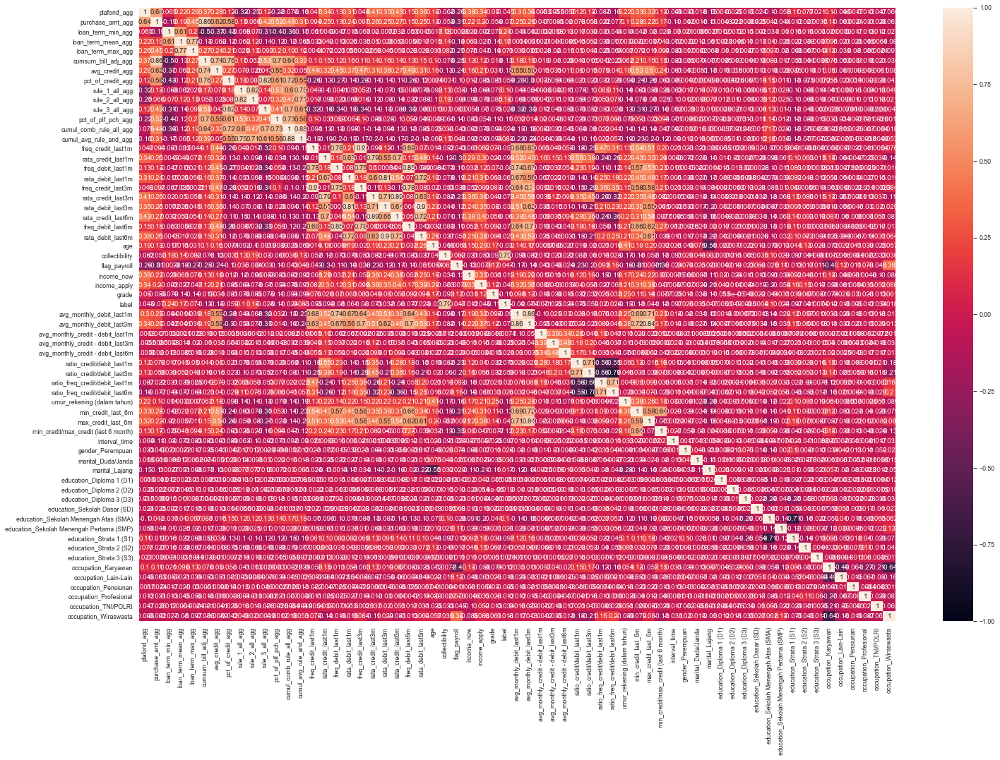

In [35]:
fig, ax = plt.subplots(figsize=(24,16))
sns.heatmap(cropped_for_corr.corr(method='spearman'), vmin=-1, vmax=1, annot=True)
plt.show()

# Korelasi tanpa IV (semua fitur)

In [45]:
df_train_drop = df_train.drop(columns=['Employee_Name','DateofTermination'])
list_f = df_train_drop.columns.tolist()

In [47]:
list_f

['label',
 'EngagementSurvey',
 'EmpSatisfaction',
 'SpecialProjectsCount',
 'DaysLateLast30',
 'Absences',
 'MarriedID_Married',
 'MarriedID_Not married',
 'MaritalStatusID_Divorced',
 'MaritalStatusID_Married',
 'MaritalStatusID_Single',
 'MaritalStatusID_Widowed',
 'GenderID_F',
 'GenderID_M',
 'EmpStatusID_Karyawan Organik',
 'EmpStatusID_Prohire',
 'EmpStatusID_TKP/ Outsource',
 'RoleID_Artificial Intelligent',
 'RoleID_Back End Developer',
 'RoleID_Business Analyst',
 'RoleID_DevOps Engineer',
 'RoleID_Digital Product Manager',
 'RoleID_Front End Developer',
 'RoleID_Mobile Developer Android',
 'RoleID_Mobile Developer iOS',
 'RoleID_Product Owner',
 'RoleID_Scrum Master',
 'RoleID_Software Architect',
 'RoleID_System Documentation',
 'RoleID_UI Designer',
 'RoleID_UX Designer',
 'RoleID_UX Researcher',
 'RoleID_UX Writer',
 'LevelID_Junior',
 'LevelID_Middle',
 'LevelID_Senior',
 'PerfScoreID_Average',
 'PerfScoreID_Exceed',
 'PerfScoreID_Fully meets',
 'PerfScoreID_Need improve

In [48]:
df_corr_iv_1 = df_train[list_f]
df_corr_new1 = df_corr_iv_1.drop(columns='label')
df_corr_new1.head()

correlation_1 = cross_corr_mean(df_corr_new1, corr_coeff=0.9, savefile=1)

df_corr_new1['label'] = df_corr_iv_1['label']
df_selected_features1 = df_corr_new1.drop(columns=correlation_1)
selected_features = df_selected_features1.columns.to_list()[:-1]

In [49]:
selected_features

['EngagementSurvey',
 'EmpSatisfaction',
 'SpecialProjectsCount',
 'DaysLateLast30',
 'Absences',
 'MaritalStatusID_Divorced',
 'MaritalStatusID_Married',
 'MaritalStatusID_Single',
 'MaritalStatusID_Widowed',
 'GenderID_M',
 'EmpStatusID_Karyawan Organik',
 'EmpStatusID_Prohire',
 'RoleID_Artificial Intelligent',
 'RoleID_Back End Developer',
 'RoleID_Business Analyst',
 'RoleID_DevOps Engineer',
 'RoleID_Digital Product Manager',
 'RoleID_Front End Developer',
 'RoleID_Mobile Developer Android',
 'RoleID_Mobile Developer iOS',
 'RoleID_Product Owner',
 'RoleID_Scrum Master',
 'RoleID_Software Architect',
 'RoleID_System Documentation',
 'RoleID_UI Designer',
 'RoleID_UX Designer',
 'RoleID_UX Researcher',
 'RoleID_UX Writer',
 'LevelID_Junior',
 'LevelID_Middle',
 'LevelID_Senior',
 'PerfScoreID_Average',
 'PerfScoreID_Exceed',
 'PerfScoreID_Fully meets',
 'PerfScoreID_Need improvement',
 'PerfScoreID_Special treatment',
 'Tribe_COM',
 'Tribe_EDU',
 'Tribe_ENT',
 'Tribe_EWD',
 'Tribe

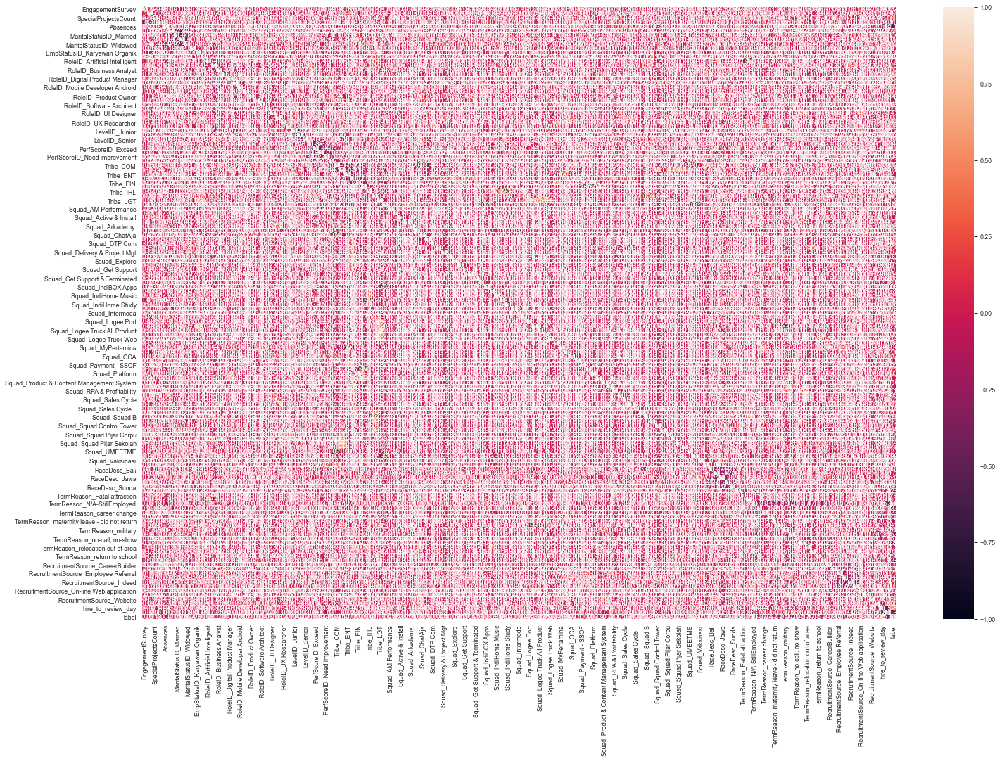

In [50]:
pearson_corr = df_selected_features1.corr(method='spearman')
#cropped_for_corr = df_selected_features_all.iloc[:,:40]
cropped_for_corr = df_selected_features1
cropped_for_corr['label'] = df_selected_features1['label']
fig, ax = plt.subplots(figsize=(24,16))
sns.heatmap(cropped_for_corr.corr(method='spearman'), vmin=-1, vmax=1, annot=True)
plt.show()

# Hasil IV dilakukan correlation antar fitur (disaring lagi)

## FITUR 1 0.02 <= IV <= 0.5

In [103]:
list_fitur_1

['most_used_pct_l12h',
 'most_used_pct_l3h',
 'most_used_pct_l6h',
 'login_attempt_l1d',
 'most_used_pct_l1d',
 'diff_most_pct_l1h',
 'most_used_pct_l2d',
 'most_used_pct_l3d',
 'diff_most_pct_l3h',
 'diff_most_pct_l6h',
 'otp_interval_max',
 'diff_most_pct_l12h',
 'most_used_pct_l1h',
 'most_used_cnt_l1h',
 'diff_most_pct_l1d',
 'diff_most_device_l12h',
 'most_used_cnt_l3h',
 'most_used_cnt_l6h',
 'diff_most_pct_l2d',
 'otp_attempt_min',
 'most_used_cnt_l12h',
 'most_used_cnt',
 'login_attempt_l12h',
 'diff_most_device_l6h',
 'most_used_cnt_l3d',
 'most_used_cnt_l2d',
 'login_attempt_l6h',
 'otp_interval_mean',
 'diff_most_device_l3h',
 'otp_attempt_mean',
 'most_used_cnt_l1d',
 'last_used_cnt_l3d',
 'diff_most_device_l1h',
 'login_attempt_l3h',
 'last_used_cnt_l2d',
 'otp_interval_min',
 'last_used_cnt',
 'last_used_cnt_l1d',
 'otp_interval_median',
 'login_attempt_l1h',
 'last_used_cnt_l12h',
 'otp_attempt_max',
 'otp_attempt_median',
 'last_used_cnt_l6h']

In [104]:
list_f_1 = list_fitur_1
list_f_1.append('fraud')
list_f_1

['most_used_pct_l12h',
 'most_used_pct_l3h',
 'most_used_pct_l6h',
 'login_attempt_l1d',
 'most_used_pct_l1d',
 'diff_most_pct_l1h',
 'most_used_pct_l2d',
 'most_used_pct_l3d',
 'diff_most_pct_l3h',
 'diff_most_pct_l6h',
 'otp_interval_max',
 'diff_most_pct_l12h',
 'most_used_pct_l1h',
 'most_used_cnt_l1h',
 'diff_most_pct_l1d',
 'diff_most_device_l12h',
 'most_used_cnt_l3h',
 'most_used_cnt_l6h',
 'diff_most_pct_l2d',
 'otp_attempt_min',
 'most_used_cnt_l12h',
 'most_used_cnt',
 'login_attempt_l12h',
 'diff_most_device_l6h',
 'most_used_cnt_l3d',
 'most_used_cnt_l2d',
 'login_attempt_l6h',
 'otp_interval_mean',
 'diff_most_device_l3h',
 'otp_attempt_mean',
 'most_used_cnt_l1d',
 'last_used_cnt_l3d',
 'diff_most_device_l1h',
 'login_attempt_l3h',
 'last_used_cnt_l2d',
 'otp_interval_min',
 'last_used_cnt',
 'last_used_cnt_l1d',
 'otp_interval_median',
 'login_attempt_l1h',
 'last_used_cnt_l12h',
 'otp_attempt_max',
 'otp_attempt_median',
 'last_used_cnt_l6h',
 'fraud']

In [105]:
df_corr_iv_1 = df_train[list_f_1]
df_corr_new1 = df_corr_iv_1.drop(columns='fraud')
df_corr_new1.head()

,most_used_pct_l12h,most_used_pct_l3h,most_used_pct_l6h,login_attempt_l1d,most_used_pct_l1d,diff_most_pct_l1h,most_used_pct_l2d,most_used_pct_l3d,diff_most_pct_l3h,diff_most_pct_l6h,otp_interval_max,diff_most_pct_l12h,most_used_pct_l1h,most_used_cnt_l1h,diff_most_pct_l1d,diff_most_device_l12h,most_used_cnt_l3h,most_used_cnt_l6h,diff_most_pct_l2d,otp_attempt_min,most_used_cnt_l12h,most_used_cnt,login_attempt_l12h,diff_most_device_l6h,most_used_cnt_l3d,most_used_cnt_l2d,login_attempt_l6h,otp_interval_mean,diff_most_device_l3h,otp_attempt_mean,most_used_cnt_l1d,last_used_cnt_l3d,diff_most_device_l1h,login_attempt_l3h,last_used_cnt_l2d,otp_interval_min,last_used_cnt,last_used_cnt_l1d,otp_interval_median,login_attempt_l1h,last_used_cnt_l12h,otp_attempt_max,otp_attempt_median,last_used_cnt_l6h
0,1.0,1.0,1.0,4.0,1.0,0.0,1.0,1.0,0.0,0.0,59.0,0.0,1.0,4.0,0.0,0.0,4.0,4.0,0.0,1.0,4.0,4.0,4.0,0.0,4.0,4.0,4.0,48.0,0.0,1.000000,4.0,4.0,0.0,4.0,4.0,37.0,4.0,4.0,48.0,4.0,4.0,1.0,1.0,4.0
1,1.0,1.0,1.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,13.0,0.0,1.0,2.0,0.0,0.0,2.0,2.0,0.0,1.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,13.0,0.0,1.000000,2.0,2.0,0.0,2.0,2.0,13.0,2.0,2.0,13.0,2.0,2.0,1.0,1.0,2.0
2,1.0,1.0,1.0,3.0,1.0,0.0,1.0,1.0,0.0,0.0,39.0,0.0,1.0,3.0,0.0,0.0,3.0,3.0,0.0,2.0,3.0,3.0,3.0,0.0,3.0,3.0,3.0,25.0,0.0,2.000000,3.0,3.0,0.0,3.0,3.0,11.0,3.0,3.0,25.0,3.0,3.0,2.0,2.0,3.0
3,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,1.0,1.0,55.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0,1.0,1.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,34.5,2.0,1.000000,0.0,2.0,2.0,2.0,2.0,14.0,2.0,2.0,34.5,2.0,2.0,1.0,1.0,2.0
4,1.0,1.0,1.0,5.0,1.0,0.0,1.0,1.0,0.0,0.0,22.0,0.0,1.0,2.0,0.0,0.0,5.0,5.0,0.0,0.0,5.0,5.0,5.0,0.0,5.0,5.0,5.0,20.0,0.0,0.666667,5.0,5.0,0.0,5.0,5.0,18.0,5.0,5.0,20.0,2.0,5.0,1.0,1.0,5.0


In [106]:
df_corr_iv_1.head()

,most_used_pct_l12h,most_used_pct_l3h,most_used_pct_l6h,login_attempt_l1d,most_used_pct_l1d,diff_most_pct_l1h,most_used_pct_l2d,most_used_pct_l3d,diff_most_pct_l3h,diff_most_pct_l6h,otp_interval_max,diff_most_pct_l12h,most_used_pct_l1h,most_used_cnt_l1h,diff_most_pct_l1d,diff_most_device_l12h,most_used_cnt_l3h,most_used_cnt_l6h,diff_most_pct_l2d,otp_attempt_min,most_used_cnt_l12h,most_used_cnt,login_attempt_l12h,diff_most_device_l6h,most_used_cnt_l3d,most_used_cnt_l2d,login_attempt_l6h,otp_interval_mean,diff_most_device_l3h,otp_attempt_mean,most_used_cnt_l1d,last_used_cnt_l3d,diff_most_device_l1h,login_attempt_l3h,last_used_cnt_l2d,otp_interval_min,last_used_cnt,last_used_cnt_l1d,otp_interval_median,login_attempt_l1h,last_used_cnt_l12h,otp_attempt_max,otp_attempt_median,last_used_cnt_l6h,fraud
0,1.0,1.0,1.0,4.0,1.0,0.0,1.0,1.0,0.0,0.0,59.0,0.0,1.0,4.0,0.0,0.0,4.0,4.0,0.0,1.0,4.0,4.0,4.0,0.0,4.0,4.0,4.0,48.0,0.0,1.000000,4.0,4.0,0.0,4.0,4.0,37.0,4.0,4.0,48.0,4.0,4.0,1.0,1.0,4.0,0
1,1.0,1.0,1.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,13.0,0.0,1.0,2.0,0.0,0.0,2.0,2.0,0.0,1.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,13.0,0.0,1.000000,2.0,2.0,0.0,2.0,2.0,13.0,2.0,2.0,13.0,2.0,2.0,1.0,1.0,2.0,0
2,1.0,1.0,1.0,3.0,1.0,0.0,1.0,1.0,0.0,0.0,39.0,0.0,1.0,3.0,0.0,0.0,3.0,3.0,0.0,2.0,3.0,3.0,3.0,0.0,3.0,3.0,3.0,25.0,0.0,2.000000,3.0,3.0,0.0,3.0,3.0,11.0,3.0,3.0,25.0,3.0,3.0,2.0,2.0,3.0,0
3,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,1.0,1.0,55.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0,1.0,1.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,34.5,2.0,1.000000,0.0,2.0,2.0,2.0,2.0,14.0,2.0,2.0,34.5,2.0,2.0,1.0,1.0,2.0,0
4,1.0,1.0,1.0,5.0,1.0,0.0,1.0,1.0,0.0,0.0,22.0,0.0,1.0,2.0,0.0,0.0,5.0,5.0,0.0,0.0,5.0,5.0,5.0,0.0,5.0,5.0,5.0,20.0,0.0,0.666667,5.0,5.0,0.0,5.0,5.0,18.0,5.0,5.0,20.0,2.0,5.0,1.0,1.0,5.0,0


In [109]:
correlation_1 = cross_corr_mean(df_corr_new1, corr_coeff=0.9, savefile=1)

In [110]:
df_corr_new1['fraud'] = df_corr_iv_1['fraud']
df_selected_features1 = df_corr_new1.drop(columns=correlation_1)
selected_features_1 = df_selected_features1.columns.to_list()[:-1]

In [112]:
selected_features_1

['most_used_pct_l3d',
 'diff_most_pct_l1d',
 'otp_attempt_min',
 'most_used_cnt_l12h',
 'most_used_cnt_l3d',
 'otp_attempt_mean',
 'most_used_cnt_l1d',
 'last_used_cnt_l3d',
 'diff_most_device_l1h',
 'otp_interval_min',
 'last_used_cnt',
 'otp_interval_median',
 'login_attempt_l1h',
 'otp_attempt_max',
 'otp_attempt_median',
 'last_used_cnt_l6h']

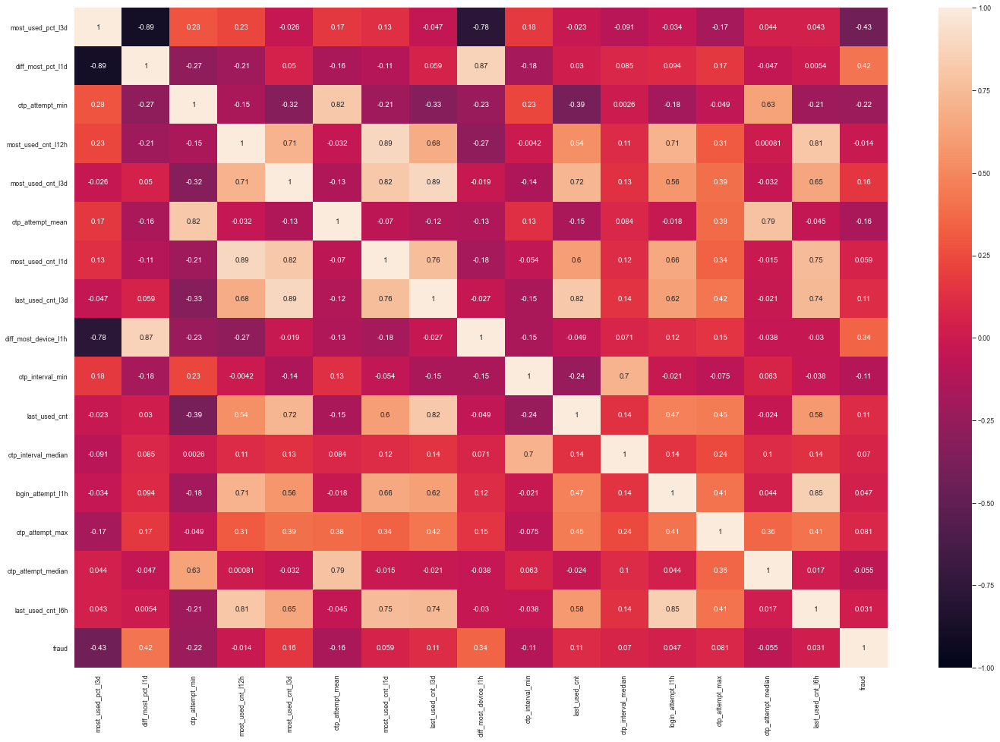

In [114]:
pearson_corr = df_selected_features1.corr(method='spearman')
#cropped_for_corr = df_selected_features_all.iloc[:,:40]
cropped_for_corr = df_selected_features1
cropped_for_corr['fraud'] = df_selected_features1['fraud']
fig, ax = plt.subplots(figsize=(24,16))
sns.heatmap(cropped_for_corr.corr(method='spearman'), vmin=-1, vmax=1, annot=True)
plt.show()

## FITUR 2 IV 0.1 < IV <= 0.5

In [62]:
list_f_2 = list_fitur_2
list_f_2.append('label')

In [63]:
df_corr_iv_2 = df_train[list_f_2]
df_corr_new2 = df_corr_iv_2.drop(columns='label')
correlation_2 = cross_corr_mean(df_corr_new2, corr_coeff=0.9, savefile=1)
df_corr_new2['label'] = df_corr_iv_2['label']
df_selected_features2 = df_corr_new2.drop(columns=correlation_2)
selected_features_2 = df_selected_features2.columns.to_list()[:-1]

In [69]:
selected_features_2

['loan_term_mean_agg',
 'rule_2_all_agg',
 'rule_1_all_agg',
 'avg_credit_agg',
 'umur_rekening (hari)',
 'avg_monthly_credit - debit_last1m',
 'avg_monthly_credit - debit_last3m',
 'cumsum_bill_adj_agg',
 'interval_time',
 'avg_monthly_credit - debit_last6m',
 'min_credit_last_6m',
 'cumul_comb_rule_all_agg',
 'grade',
 'min_credit/max_credit (last 6 month)',
 'freq_credit_last3m',
 'rata_credit_last1m',
 'purchase_amt_agg',
 'freq_credit_last1m',
 'freq_debit_last1m',
 'avg_monthly_debit_last1m',
 'education_Strata 1 (S1)',
 'education_Sekolah Menengah Atas (SMA)',
 'avg_monthly_debit_last6m']

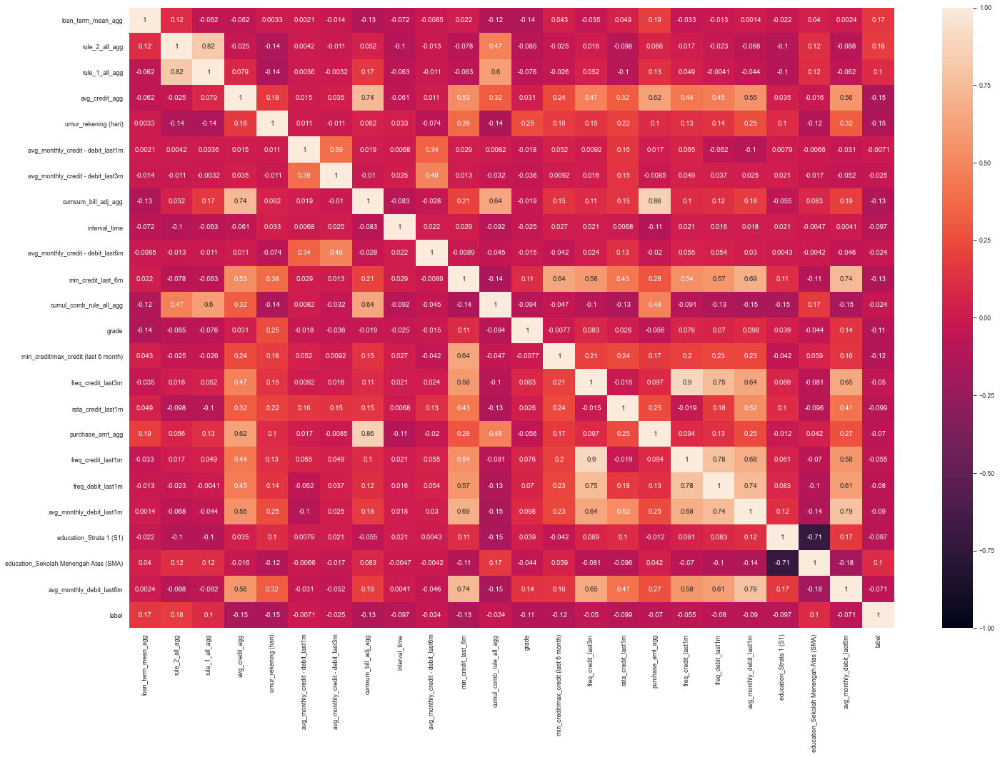

In [70]:
pearson_corr = df_selected_features2.corr(method='spearman')
#cropped_for_corr = df_selected_features_all.iloc[:,:40]
cropped_for_corr = df_selected_features2
cropped_for_corr['label'] = df_selected_features2['label']
fig, ax = plt.subplots(figsize=(24,16))
sns.heatmap(cropped_for_corr.corr(method='spearman'), vmin=-1, vmax=1, annot=True)
plt.show()

## FITUR 3 IV 0.3 < IV <= 0.5

In [71]:
list_f_3 = iv_res3.sort_values('IV', ascending=False).T.columns.to_list()
list_f_3.append('label')

In [72]:
df_corr_iv_3 = df_train[list_f_3]
df_corr_new3 = df_corr_iv_3.drop(columns='label')
correlation_3 = cross_corr_mean(df_corr_new3, corr_coeff=0.9, savefile=1)
df_corr_new3['label'] = df_corr_iv_3['label']
df_selected_features3 = df_corr_new3.drop(columns=correlation_3)
selected_features_3 = df_selected_features3.columns.to_list()[:-1]

In [76]:
selected_features_3

['loan_term_mean_agg',
 'rule_2_all_agg',
 'comb_rule_all_agg',
 'rule_1_all_agg',
 'avg_credit_agg',
 'umur_rekening (dalam tahun)',
 'avg_monthly_credit - debit_last1m']

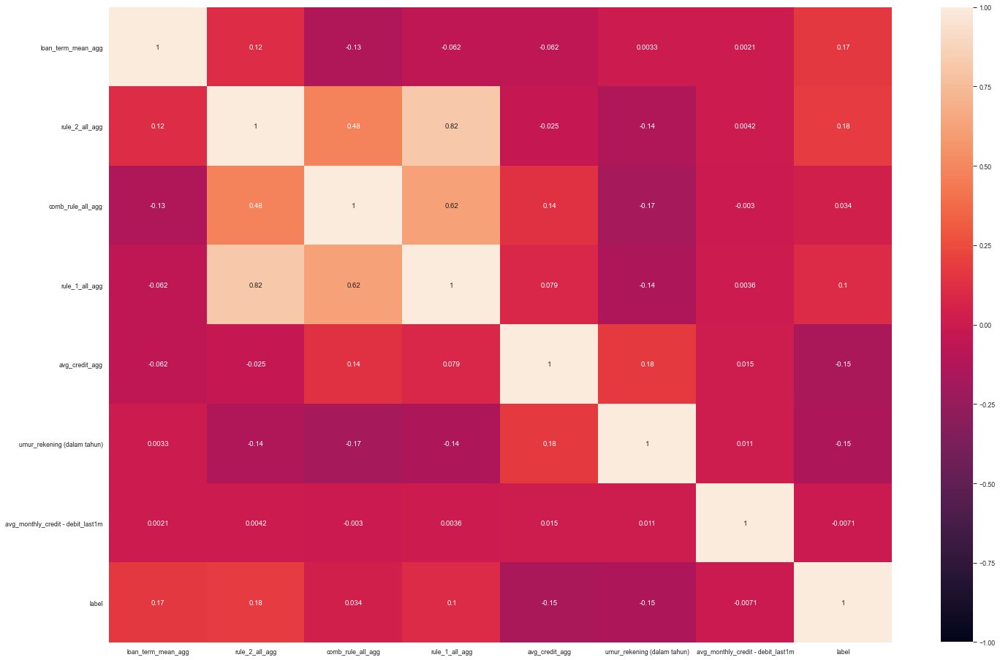

In [77]:
pearson_corr = df_selected_features3.corr(method='spearman')
#cropped_for_corr = df_selected_features_all.iloc[:,:40]
cropped_for_corr = df_selected_features3
cropped_for_corr['label'] = df_selected_features3['label']
fig, ax = plt.subplots(figsize=(24,16))
sns.heatmap(cropped_for_corr.corr(method='spearman'), vmin=-1, vmax=1, annot=True)
plt.show()

# Correlation fitur dengan target variabel

In [83]:
def get_contigency(dframe, first_feature, second_feature):
    return chi2_contingency(pd.crosstab(dframe[first_feature], dframe[second_feature]))

def chisquare_test(dframe, first_feature, second_feature):
    calculated_value, p_value, degree_freedom, expected_value = get_contigency(dframe, first_feature, second_feature)
    return [calculated_value, p_value, degree_freedom, expected_value]

def print_stats_value(first_feature, second_feature, calculated_value, degree_freedom, prob_value=0.95):
    print("\n=== Test-Statistical ===")
    print('='*25)
    print("Degree of Freedom: %d\n" % degree_freedom)
    critical_value = chi2.ppf(prob_value, degree_freedom)
    print("Probability = %.3f; Critical Value = %.3f; Statistical Value = %.3f" % (prob_value, critical_value, calculated_value))
    
    if abs(calculated_value) >= critical_value:
        print("Result => Fitur %s dan %s saling dependen (Ho dapat ditolak)\n" % (first_feature, second_feature))
    else:
        print("Result => Fitur %s dan %s saling independen (Ho tidak dapat ditolak)\n" % (first_feature, second_feature))

def print_pvalue_value(first_feature, second_feature, p_value, prob_value=0.95):
    print("\n=== P-Value ===")
    print('='*25)
    alpha = 1.0 - prob_value
    print("Significance = %.3f; p-value = %.3f" % (alpha, p_value))
    
    if p_value <= alpha:
        print("Result => Fitur %s dan %s saling dependen (Ho dapat ditolak)\n" % (first_feature, second_feature))
    else:
        print("Result => Fitur %s dan %s saling independen (Ho tidak dapat ditolak)\n" % (first_feature, second_feature))

    print('='*25)

def interpret_pvalue(p_value, prob_value=0.95):
    alpha = 1.0 - prob_value
    dep_result = 'dependen' if p_value <= alpha else 'independen'
    return [alpha, dep_result]

def pearson_correlation(dframe, first_feature, second_feature):
    first_values = np.array(dframe[first_feature], dtype='float').flatten()
    second_values = np.array(dframe[second_feature], dtype='float').flatten()

    pearson_result = pearsonr(first_values, second_values)
    return pearson_result # output -> [correlation_value, p_value]

def spearman_correlation(dframe, first_feature, second_feature):
    first_values = np.array(dframe[first_feature], dtype='float').flatten()
    second_values = np.array(dframe[second_feature], dtype='float').flatten()

    spearman_result = spearmanr(first_values, second_values)
    return spearman_result # output -> [correlation_value, p_value]

def correlation_totarget(dframe, target_feature, method='pearson'):
    rs_corr = pd.DataFrame(columns=['feature_name', 'feature_target', 'correlation_value', 'p_value', 'alpha', 'result'])
    for fitur in dframe.columns.difference(target_feature).tolist():
        if method == 'pearson':
            corr_result = pearson_correlation(dframe, fitur, target_feature)
            pvalue_interpret = interpret_pvalue(corr_result[1])
        elif method == 'spearman':
            corr_result = spearman_correlation(dframe, fitur, target_feature)
            pvalue_interpret = interpret_pvalue(corr_result[1])
        elif method == 'chisquare':
            corr_result = chisquare_test(dframe, fitur, target_feature)
            pvalue_interpret = interpret_pvalue(corr_result[1])
        else:
            raise ValueError('Method \"%s\" is not available' % str(method))

        rs_corr = rs_corr.append(pd.Series([fitur, target_feature, corr_result[0], corr_result[1], pvalue_interpret[0], pvalue_interpret[1]], index=['feature_name', 'feature_target', 'correlation_value', 'p_value', 'alpha', 'result']), ignore_index=True)

    return rs_corr

In [66]:
df_corr_vote = df_train[selected_features_vote]

In [67]:
df_corr_vote['Flag'] = df_train['Flag']

In [68]:
no_q = df_corr_vote.dropna(axis='columns')

In [69]:
## CORRELATION PARAMS WITH TARGET LABEL
params_corr_vote = correlation_totarget(no_q, ['Flag'], method='spearman')
params_corr_vote

,feature_name,feature_target,correlation_value,p_value,alpha,result
0,Max_amt_credit_last6Bln,[Flag],0.148297,5.547423e-11,0.05,dependen
1,Min_cbal_base_last6bln,[Flag],0.324149,1.409693e-48,0.05,dependen
2,Usia,[Flag],-0.096978,1.926298e-05,0.05,dependen
3,jenis_pekerjaan_UNDEFINED,[Flag],-0.256316,2.103331e-30,0.05,dependen
4,total_amt_credit_3bln,[Flag],0.287162,4.724101e-38,0.05,dependen
5,total_amt_debit_3bln,[Flag],0.327844,1.029563e-49,0.05,dependen
6,total_hari_credit_6bln,[Flag],0.279562,4.483546e-36,0.05,dependen


In [70]:
p_value_vote = params_corr_vote[(params_corr_vote.correlation_value >= 0.03) | (params_corr_vote.correlation_value <= -0.03)]

In [71]:
p_value_vote.feature_name.to_list()

['Max_amt_credit_last6Bln',
 'Min_cbal_base_last6bln',
 'Usia',
 'jenis_pekerjaan_UNDEFINED',
 'total_amt_credit_3bln',
 'total_amt_debit_3bln',
 'total_hari_credit_6bln']

## ALL FEATURES

In [115]:
df_for_corr = df_train[list_all_features]

NameError: name 'list_all_features' is not defined

In [104]:
#df_train[list_all_features].columns

df_train = df_train.drop(['cif_id'], axis=1)

In [74]:
df_for_corr['Flag'] = df_train['Flag']

In [106]:
df_train.columns

Index(['plafond_agg', 'purchase_amt_agg', 'loan_term_min_agg',
       'loan_term_mean_agg', 'loan_term_max_agg', 'total_spent_l3d_agg',
       'cumsum_bill_adj_agg', 'avg_credit_agg', 'pct_of_credit_agg',
       'rule_1_all_agg', 'rule_2_all_agg', 'rule_3_all_agg',
       'comb_rule_all_agg', 'pct_of_plf_pch_agg', 'pct_of_plf_l3d_agg',
       'comb_rule_and_agg', 'cumul_comb_rule_all_agg',
       'cumul_comb_rule_and_agg', 'cumul_avg_rule_all_agg',
       'cumul_avg_rule_and_agg', 'freq_credit_last1m', 'rata_credit_last1m',
       'freq_debit_last1m', 'rata_debit_last1m', 'freq_credit_last3m',
       'rata_credit_last3m', 'freq_debit_last3m', 'rata_debit_last3m',
       'freq_credit_last6m', 'rata_credit_last6m', 'freq_debit_last6m',
       'rata_debit_last6m', 'age', 'collectibility', 'flag_payroll',
       'income_now', 'income_apply', 'grade', 'label',
       'avg_monthly_credit_last1m', 'avg_monthly_credit_last3m',
       'avg_monthly_credit_last6m', 'avg_monthly_debit_last1m',
   

In [75]:
#df_for_corr = df_for_corr[df_for_corr.columns[~df_for_corr.isna().any()].tolist()]

In [107]:
no_null = df_train.dropna(axis='columns')

In [111]:
## CORRELATION PARAMS WITH TARGET LABEL
params_corr = correlation_totarget(no_null, ['label'], method='spearman')
params_corr

,feature_name,feature_target,correlation_value,p_value,alpha,result
0,age,[label],-0.029853,2.633994e-03,0.05,dependen
1,avg_credit_agg,[label],-0.154954,1.467542e-55,0.05,dependen
2,avg_monthly_credit - debit_last1m,[label],-0.007136,4.722801e-01,0.05,independen
3,avg_monthly_credit - debit_last3m,[label],-0.025300,1.081508e-02,0.05,dependen
4,avg_monthly_credit - debit_last6m,[label],-0.023866,1.621314e-02,0.05,dependen
5,avg_monthly_credit_last1m,[label],-0.090828,4.856923e-20,0.05,dependen
6,avg_monthly_credit_last3m,[label],-0.079276,1.272666e-15,0.05,dependen
7,avg_monthly_credit_last6m,[label],-0.076118,1.619384e-14,0.05,dependen
8,avg_monthly_debit_last1m,[label],-0.090111,9.505288e-20,0.05,dependen
9,avg_monthly_debit_last3m,[label],-0.073804,9.793011e-14,0.05,dependen


In [112]:
params_corr.to_csv('corr_all.csv')

Filter p value part 1

In [114]:
p_value_2 = params_corr[(params_corr.correlation_value >= 0.1) | (params_corr.correlation_value <= -0.1)]

In [115]:
p_value_2

,feature_name,feature_target,correlation_value,p_value,alpha,result
1,avg_credit_agg,[label],-0.154954,1.467542e-55,0.05,dependen
11,collectibility,[label],0.790621,0.000000e+00,0.05,dependen
14,cumsum_bill_adj_agg,[label],-0.127870,2.963381e-38,0.05,dependen
23,education_Sekolah Menengah Atas (SMA),[label],0.102057,6.612365e-25,0.05,dependen
37,grade,[label],-0.107502,1.805957e-27,0.05,dependen
42,loan_term_mean_agg,[label],0.169560,2.529726e-66,0.05,dependen
43,loan_term_min_agg,[label],0.237532,3.836234e-130,0.05,dependen
49,min_credit/max_credit (last 6 month),[label],-0.115266,2.338033e-31,0.05,dependen
50,min_credit_last_6m,[label],-0.127051,8.754948e-38,0.05,dependen
51,min_debit_last_6m,[label],-0.128440,1.389415e-38,0.05,dependen


In [117]:
list_p_2 = p_value_2.feature_name.to_list()
list_p_2.append('label')

In [118]:
list_p_2

['avg_credit_agg',
 'collectibility',
 'cumsum_bill_adj_agg',
 'education_Sekolah Menengah Atas (SMA)',
 'grade',
 'loan_term_mean_agg',
 'loan_term_min_agg',
 'min_credit/max_credit (last 6 month)',
 'min_credit_last_6m',
 'min_debit_last_6m',
 'pct_of_plf_pch_agg',
 'rule_1_all_agg',
 'rule_2_all_agg',
 'umur_rekening (dalam tahun)',
 'umur_rekening (hari)',
 'label']

In [119]:
df_p_val_2 = df_train[list_p_2]
df_p_val_2_new = df_p_val_2.drop(columns='label')
correlation_p2 = cross_corr_mean(df_p_val_2_new, corr_coeff=0.89, savefile=1)
df_p_val_2_new['label'] = df_p_val_2['label']
df_selected_features_p2 = df_p_val_2_new.drop(columns=correlation_p2)
selected_features_p2 = df_selected_features_p2.columns.to_list()[:-1]

In [120]:
selected_features_p2

['avg_credit_agg',
 'collectibility',
 'cumsum_bill_adj_agg',
 'education_Sekolah Menengah Atas (SMA)',
 'grade',
 'loan_term_mean_agg',
 'loan_term_min_agg',
 'min_credit/max_credit (last 6 month)',
 'min_debit_last_6m',
 'pct_of_plf_pch_agg',
 'rule_1_all_agg',
 'rule_2_all_agg',
 'umur_rekening (hari)']

Filter p value part 2

In [121]:
p_value_3 = params_corr[(params_corr.correlation_value >= 0.05) | (params_corr.correlation_value <= -0.05)]

In [122]:
list_p_3 = p_value_3.feature_name.to_list()
list_p_3.append('label')

In [123]:
list_p_3

['avg_credit_agg',
 'avg_monthly_credit_last1m',
 'avg_monthly_credit_last3m',
 'avg_monthly_credit_last6m',
 'avg_monthly_debit_last1m',
 'avg_monthly_debit_last3m',
 'avg_monthly_debit_last6m',
 'collectibility',
 'comb_rule_and_agg',
 'cumsum_bill_adj_agg',
 'cumul_avg_rule_and_agg',
 'education_Sekolah Menengah Atas (SMA)',
 'education_Strata 1 (S1)',
 'freq_credit_last1m',
 'freq_credit_last6m',
 'freq_debit_last1m',
 'freq_debit_last3m',
 'freq_debit_last6m',
 'grade',
 'interval_time',
 'loan_term_max_agg',
 'loan_term_mean_agg',
 'loan_term_min_agg',
 'min_credit/max_credit (last 6 month)',
 'min_credit_last_6m',
 'min_debit_last_6m',
 'pct_of_plf_l3d_agg',
 'pct_of_plf_pch_agg',
 'purchase_amt_agg',
 'rata_credit_last1m',
 'rata_credit_last3m',
 'rata_credit_last6m',
 'rata_debit_last1m',
 'ratio_credit/debit_last1m',
 'ratio_credit/debit_last3m',
 'ratio_credit/debit_last6m',
 'rule_1_all_agg',
 'rule_2_all_agg',
 'umur_rekening (dalam tahun)',
 'umur_rekening (hari)',
 'labe

In [124]:
df_p_val_3 = df_train[list_p_3]
df_p_val_3_new = df_p_val_3.drop(columns='label')
correlation_p3 = cross_corr_mean(df_p_val_3_new, corr_coeff=0.89, savefile=1)
df_p_val_3_new['label'] = df_p_val_3['label']
df_selected_features_p3 = df_p_val_3_new.drop(columns=correlation_p3)
selected_features_p3 = df_selected_features_p3.columns.to_list()[:-1]

In [125]:
selected_features_p3

['avg_credit_agg',
 'avg_monthly_debit_last1m',
 'avg_monthly_debit_last6m',
 'collectibility',
 'cumsum_bill_adj_agg',
 'cumul_avg_rule_and_agg',
 'education_Sekolah Menengah Atas (SMA)',
 'education_Strata 1 (S1)',
 'freq_credit_last1m',
 'freq_credit_last6m',
 'freq_debit_last1m',
 'freq_debit_last6m',
 'grade',
 'interval_time',
 'loan_term_max_agg',
 'loan_term_mean_agg',
 'loan_term_min_agg',
 'min_credit/max_credit (last 6 month)',
 'min_credit_last_6m',
 'pct_of_plf_pch_agg',
 'purchase_amt_agg',
 'rata_credit_last1m',
 'rata_credit_last3m',
 'rata_credit_last6m',
 'rata_debit_last1m',
 'ratio_credit/debit_last1m',
 'ratio_credit/debit_last3m',
 'ratio_credit/debit_last6m',
 'rule_1_all_agg',
 'rule_2_all_agg',
 'umur_rekening (hari)']

Filter p value part 3

In [126]:
p_value_4 = params_corr[(params_corr.correlation_value >= 0.01) | (params_corr.correlation_value <= -0.01)]

In [127]:
list_p_4 = p_value_4.feature_name.to_list()
list_p_4.append('label')

In [128]:
df_p_val_4 = df_train[list_p_4]
df_p_val_4_new = df_p_val_4.drop(columns='label')
correlation_p4 = cross_corr_mean(df_p_val_4_new, corr_coeff=0.89, savefile=1)
df_p_val_4_new['label'] = df_p_val_4['label']
df_selected_features_p4 = df_p_val_4_new.drop(columns=correlation_p4)
selected_features_p4 = df_selected_features_p4.columns.to_list()[:-1]

In [129]:
selected_features_p4

['age',
 'avg_credit_agg',
 'avg_monthly_credit - debit_last3m',
 'avg_monthly_credit - debit_last6m',
 'avg_monthly_debit_last1m',
 'avg_monthly_debit_last3m',
 'collectibility',
 'cumsum_bill_adj_agg',
 'cumul_avg_rule_and_agg',
 'cumul_comb_rule_all_agg',
 'education_Diploma 2 (D2)',
 'education_Sekolah Menengah Atas (SMA)',
 'education_Sekolah Menengah Pertama (SMP)',
 'education_Strata 1 (S1)',
 'education_Strata 2 (S2)',
 'flag_payroll',
 'freq_credit_last1m',
 'freq_credit_last6m',
 'freq_debit_last1m',
 'freq_debit_last6m',
 'gender_Perempuan',
 'grade',
 'income_apply',
 'income_now',
 'interval_time',
 'loan_term_max_agg',
 'loan_term_mean_agg',
 'loan_term_min_agg',
 'marital_Duda/Janda',
 'marital_Lajang',
 'max_credit_last_6m',
 'min_credit/max_credit (last 6 month)',
 'min_credit_last_6m',
 'occupation_Karyawan',
 'occupation_Lain-Lain',
 'occupation_Profesional',
 'occupation_TNI/POLRI',
 'occupation_Wiraswasta',
 'pct_of_credit_agg',
 'pct_of_plf_pch_agg',
 'plafond_agg

In [130]:
def bar_corr():
    fig, ax = plt.subplots(figsize=(20,10))
    sns.barplot(x='correlation_value', y='feature_name',
                data=params_corr.sort_values('correlation_value', ascending=False), orient='h',palette='RdBu_r')
    plt.xlabel('Correlation to Target Label')
    plt.ylabel('Features')
    ax.yaxis.label.set_size(10)
    ax.xaxis.label.set_size(10)

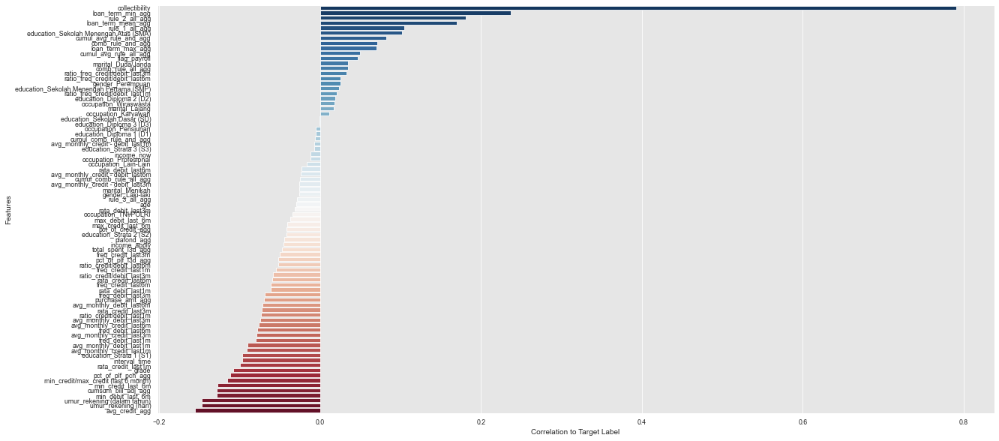

In [131]:
bar_corr()

In [95]:
iv_res2, woe_res2 = get_information_values(df_selected_features_p2, target='Flag')

Information value of Min_amt_credit_last6Bln is 0.285695
Information value of Min_cbal_base_last6bln is 0.752362
Information value of jenis_pekerjaan_UNDEFINED is 0.444967
Information value of jenis_pekerjaan_WIRASWASTA is 0.342576
Information value of pendidikan_SD/SMP is 0.067656
Information value of pendidikan_SMA is 0.08126
Information value of pendidikan_UNDEFINED is 0.183148
Information value of total_amt_credit_6bln is 1.153263
Information value of total_amt_credit_last_month1 is 0.0
Information value of total_amt_debit_last_month1 is 0.137636
Information value of total_amt_debit_last_month3 is 0.11969
Information value of total_amt_debit_last_month4 is 0.14142
Information value of total_amt_debit_last_month5 is 0.132501
Information value of total_amt_debit_last_month6 is 0.15691
Information value of total_freq_credit_3bln is 0.310698
Information value of total_freq_credit_last_month2 is 0.0


In [96]:
iv_res_p2 = iv_res2[(iv_res2.IV < 0.5) & (iv_res2.IV >= 0.1)].set_index('Variable')
iv_res_p2.sort_values('IV', ascending=False)

,IV
Variable,
jenis_pekerjaan_UNDEFINED,0.444967
jenis_pekerjaan_WIRASWASTA,0.342576
total_freq_credit_3bln,0.310698
Min_amt_credit_last6Bln,0.285695
pendidikan_UNDEFINED,0.183148
total_amt_debit_last_month6,0.156910
total_amt_debit_last_month4,0.141420
total_amt_debit_last_month1,0.137636
total_amt_debit_last_month5,0.132501


In [97]:
selected_features_p2_iv = iv_res_p2.index.to_list()

In [98]:
selected_features_p2_iv

['Min_amt_credit_last6Bln',
 'jenis_pekerjaan_UNDEFINED',
 'jenis_pekerjaan_WIRASWASTA',
 'pendidikan_UNDEFINED',
 'total_amt_debit_last_month1',
 'total_amt_debit_last_month3',
 'total_amt_debit_last_month4',
 'total_amt_debit_last_month5',
 'total_amt_debit_last_month6',
 'total_freq_credit_3bln']

WoE

In [99]:
woe_df = woe_res.groupby('Variable').agg(sum).reset_index()

In [100]:
woe_fitur_1 = woe_df[woe_df.Variable.isin(selected_features_1)].sort_values('IV', ascending=False)

In [101]:
woe_fitur_2 = woe_df[woe_df.Variable.isin(selected_features_2)].sort_values('IV', ascending=False)

In [102]:
woe_fitur_3 = woe_df[woe_df.Variable.isin(selected_features_3)].sort_values('IV', ascending=False)

In [103]:
woe_fitur_4 = woe_df[woe_df.Variable.isin(selected_features_p2)].sort_values('IV', ascending=False)

## Mutual Information

In [28]:
from sklearn.feature_selection import mutual_info_classif

In [29]:
df_int = df_train.select_dtypes(exclude=['object'])

In [31]:
list_column = df_int.columns.to_list()
list_inf    = []

for i in range(df_int.shape[1]):
    list_inf.append(df_int[list_column[i]].max())
    
inf_list = pd.DataFrame(
    {'Fitur': list_column,
     'Inf ?': list_inf,
    })

inf_list

,Fitur,Inf ?
0,plafond_agg,2.000000e+07
1,purchase_amt_agg,1.025543e+08
2,loan_term_min_agg,1.200000e+01
3,rule_1_all_agg,4.900000e+01
4,rule_2_all_agg,2.300000e+01
5,rule_3_all_agg,1.210000e+02
6,comb_rule_all_agg,1.230000e+02
7,pct_of_plf_pch_agg,3.353883e+01
8,pct_of_plf_l3d_agg,4.551083e+01
9,comb_rule_and_agg,1.250000e+02


In [32]:
df_feature_2=df_int.replace([np.inf, -np.inf], np.nan).dropna()

In [37]:
df_feature_2.head()

,plafond_agg,purchase_amt_agg,loan_term_min_agg,rule_1_all_agg,rule_2_all_agg,rule_3_all_agg,comb_rule_all_agg,pct_of_plf_pch_agg,pct_of_plf_l3d_agg,comb_rule_and_agg,cumul_comb_rule_all_agg,cumul_comb_rule_and_agg,cumul_avg_rule_all_agg,cumul_avg_rule_and_agg,freq_credit_last1m,rata_credit_last1m,freq_debit_last1m,rata_debit_last1m,freq_credit_last3m,rata_credit_last3m,freq_debit_last3m,rata_debit_last3m,freq_credit_last6m,rata_credit_last6m,freq_debit_last6m,rata_debit_last6m,age,flag_payroll,income_now,income_apply,grade,avg_monthly_credit_last1m,avg_monthly_credit_last3m,avg_monthly_credit_last6m,avg_monthly_debit_last1m,avg_monthly_debit_last3m,avg_monthly_debit_last6m,avg_monthly_credit - debit_last1m,avg_monthly_credit - debit_last3m,avg_monthly_credit - debit_last6m,ratio_credit/debit_last1m,ratio_credit/debit_last3m,ratio_credit/debit_last6m,ratio_freq_credit/debit_last1m,ratio_freq_credit/debit_last3m,ratio_freq_credit/debit_last6m,umur_rekening (hari),umur_rekening (dalam tahun),min_credit_last_6m,max_credit_last_6m,min_debit_last_6m,max_debit_last_6m,min_credit/max_credit (last 6 month),interval_time,gender_Laki-laki,gender_Perempuan,marital_Duda/Janda,marital_Lajang,marital_Menikah,education_Diploma 1 (D1),education_Diploma 2 (D2),education_Diploma 3 (D3),education_Sekolah Dasar (SD),education_Sekolah Menengah Atas (SMA),education_Sekolah Menengah Pertama (SMP),education_Strata 1 (S1),education_Strata 2 (S2),education_Strata 3 (S3),occupation_Karyawan,occupation_Lain-Lain,occupation_Pensiunan,occupation_Profesional,occupation_TNI/POLRI,occupation_Wiraswasta,credit.loan_term_mean_agg,credit.loan_term_max_agg,credit.total_spent_l3d_agg,credit.cumsum_bill_adj_agg,credit.avg_credit_agg,credit.pct_of_credit_agg,credit.COUNT(ceria),credit.MAX(ceria.age),credit.MAX(ceria.avg_monthly_credit - debit_last1m),credit.MAX(ceria.avg_monthly_credit - debit_last3m),credit.MAX(ceria.avg_monthly_credit - debit_last6m),credit.MAX(ceria.avg_monthly_credit_last1m),credit.MAX(ceria.avg_monthly_credit_last3m),credit.MAX(ceria.avg_monthly_credit_last6m),credit.MAX(ceria.avg_monthly_debit_last1m),credit.MAX(ceria.avg_monthly_debit_last3m),credit.MAX(ceria.avg_monthly_debit_last6m),credit.MAX(ceria.comb_rule_all_agg),credit.MAX(ceria.comb_rule_and_agg),credit.MAX(ceria.cumul_avg_rule_all_agg),credit.MAX(ceria.cumul_avg_rule_and_agg),credit.MAX(ceria.cumul_comb_rule_all_agg),credit.MAX(ceria.cumul_comb_rule_and_agg),credit.MAX(ceria.education_Diploma 1 (D1)),credit.MAX(ceria.education_Diploma 2 (D2)),credit.MAX(ceria.education_Diploma 3 (D3)),credit.MAX(ceria.education_Sekolah Dasar (SD)),credit.MAX(ceria.education_Sekolah Menengah Atas (SMA)),credit.MAX(ceria.education_Sekolah Menengah Pertama (SMP)),credit.MAX(ceria.education_Strata 1 (S1)),credit.MAX(ceria.education_Strata 2 (S2)),credit.MAX(ceria.education_Strata 3 (S3)),credit.MAX(ceria.flag_payroll),credit.MAX(ceria.freq_credit_last1m),credit.MAX(ceria.freq_credit_last3m),credit.MAX(ceria.freq_credit_last6m),credit.MAX(ceria.freq_debit_last1m),credit.MAX(ceria.freq_debit_last3m),credit.MAX(ceria.freq_debit_last6m),credit.MAX(ceria.gender_Laki-laki),credit.MAX(ceria.gender_Perempuan),credit.MAX(ceria.grade),credit.MAX(ceria.income_apply),credit.MAX(ceria.income_now),credit.MAX(ceria.interval_time),credit.MAX(ceria.marital_Duda/Janda),credit.MAX(ceria.marital_Lajang),credit.MAX(ceria.marital_Menikah),credit.MAX(ceria.max_credit_last_6m),credit.MAX(ceria.max_debit_last_6m),credit.MAX(ceria.min_credit/max_credit (last 6 month)),credit.MAX(ceria.min_credit_last_6m),credit.MAX(ceria.min_debit_last_6m),credit.MAX(ceria.occupation_Karyawan),credit.MAX(ceria.occupation_Lain-Lain),credit.MAX(ceria.occupation_Pensiunan),credit.MAX(ceria.occupation_Profesional),credit.MAX(ceria.occupation_TNI/POLRI),credit.MAX(ceria.occupation_Wiraswasta),credit.MAX(ceria.pct_of_plf_l3d_agg),credit.MAX(ceria.pct_of_plf_pch_agg),credit.MAX(ceria.plafond_agg),credit.MAX(ceria.purchase_amt_agg),credit.MAX(ceria.rata

In [33]:
inf_list.loc[inf_list['Inf ?']== np.inf]

,Fitur,Inf ?


In [34]:
df_feature = df_feature_2.drop(columns='label')
df_feature.head()

,plafond_agg,purchase_amt_agg,loan_term_min_agg,rule_1_all_agg,rule_2_all_agg,rule_3_all_agg,comb_rule_all_agg,pct_of_plf_pch_agg,pct_of_plf_l3d_agg,comb_rule_and_agg,cumul_comb_rule_all_agg,cumul_comb_rule_and_agg,cumul_avg_rule_all_agg,cumul_avg_rule_and_agg,freq_credit_last1m,rata_credit_last1m,freq_debit_last1m,rata_debit_last1m,freq_credit_last3m,rata_credit_last3m,freq_debit_last3m,rata_debit_last3m,freq_credit_last6m,rata_credit_last6m,freq_debit_last6m,rata_debit_last6m,age,flag_payroll,income_now,income_apply,grade,avg_monthly_credit_last1m,avg_monthly_credit_last3m,avg_monthly_credit_last6m,avg_monthly_debit_last1m,avg_monthly_debit_last3m,avg_monthly_debit_last6m,avg_monthly_credit - debit_last1m,avg_monthly_credit - debit_last3m,avg_monthly_credit - debit_last6m,ratio_credit/debit_last1m,ratio_credit/debit_last3m,ratio_credit/debit_last6m,ratio_freq_credit/debit_last1m,ratio_freq_credit/debit_last3m,ratio_freq_credit/debit_last6m,umur_rekening (hari),umur_rekening (dalam tahun),min_credit_last_6m,max_credit_last_6m,min_debit_last_6m,max_debit_last_6m,min_credit/max_credit (last 6 month),interval_time,gender_Laki-laki,gender_Perempuan,marital_Duda/Janda,marital_Lajang,marital_Menikah,education_Diploma 1 (D1),education_Diploma 2 (D2),education_Diploma 3 (D3),education_Sekolah Dasar (SD),education_Sekolah Menengah Atas (SMA),education_Sekolah Menengah Pertama (SMP),education_Strata 1 (S1),education_Strata 2 (S2),education_Strata 3 (S3),occupation_Karyawan,occupation_Lain-Lain,occupation_Pensiunan,occupation_Profesional,occupation_TNI/POLRI,occupation_Wiraswasta,credit.loan_term_mean_agg,credit.loan_term_max_agg,credit.total_spent_l3d_agg,credit.cumsum_bill_adj_agg,credit.avg_credit_agg,credit.pct_of_credit_agg,credit.COUNT(ceria),credit.MAX(ceria.age),credit.MAX(ceria.avg_monthly_credit - debit_last1m),credit.MAX(ceria.avg_monthly_credit - debit_last3m),credit.MAX(ceria.avg_monthly_credit - debit_last6m),credit.MAX(ceria.avg_monthly_credit_last1m),credit.MAX(ceria.avg_monthly_credit_last3m),credit.MAX(ceria.avg_monthly_credit_last6m),credit.MAX(ceria.avg_monthly_debit_last1m),credit.MAX(ceria.avg_monthly_debit_last3m),credit.MAX(ceria.avg_monthly_debit_last6m),credit.MAX(ceria.comb_rule_all_agg),credit.MAX(ceria.comb_rule_and_agg),credit.MAX(ceria.cumul_avg_rule_all_agg),credit.MAX(ceria.cumul_avg_rule_and_agg),credit.MAX(ceria.cumul_comb_rule_all_agg),credit.MAX(ceria.cumul_comb_rule_and_agg),credit.MAX(ceria.education_Diploma 1 (D1)),credit.MAX(ceria.education_Diploma 2 (D2)),credit.MAX(ceria.education_Diploma 3 (D3)),credit.MAX(ceria.education_Sekolah Dasar (SD)),credit.MAX(ceria.education_Sekolah Menengah Atas (SMA)),credit.MAX(ceria.education_Sekolah Menengah Pertama (SMP)),credit.MAX(ceria.education_Strata 1 (S1)),credit.MAX(ceria.education_Strata 2 (S2)),credit.MAX(ceria.education_Strata 3 (S3)),credit.MAX(ceria.flag_payroll),credit.MAX(ceria.freq_credit_last1m),credit.MAX(ceria.freq_credit_last3m),credit.MAX(ceria.freq_credit_last6m),credit.MAX(ceria.freq_debit_last1m),credit.MAX(ceria.freq_debit_last3m),credit.MAX(ceria.freq_debit_last6m),credit.MAX(ceria.gender_Laki-laki),credit.MAX(ceria.gender_Perempuan),credit.MAX(ceria.grade),credit.MAX(ceria.income_apply),credit.MAX(ceria.income_now),credit.MAX(ceria.interval_time),credit.MAX(ceria.marital_Duda/Janda),credit.MAX(ceria.marital_Lajang),credit.MAX(ceria.marital_Menikah),credit.MAX(ceria.max_credit_last_6m),credit.MAX(ceria.max_debit_last_6m),credit.MAX(ceria.min_credit/max_credit (last 6 month)),credit.MAX(ceria.min_credit_last_6m),credit.MAX(ceria.min_debit_last_6m),credit.MAX(ceria.occupation_Karyawan),credit.MAX(ceria.occupation_Lain-Lain),credit.MAX(ceria.occupation_Pensiunan),credit.MAX(ceria.occupation_Profesional),credit.MAX(ceria.occupation_TNI/POLRI),credit.MAX(ceria.occupation_Wiraswasta),credit.MAX(ceria.pct_of_plf_l3d_agg),credit.MAX(ceria.pct_of_plf_pch_agg),credit.MAX(ceria.plafond_agg),credit.MAX(ceria.purchase_amt_agg),credit.MAX(ceria.rata

In [35]:
df_feature.shape

(9869, 519)

In [15]:
list_column = df_feature.columns.to_list()
list_inf    = []

for i in range(df_feature.shape[1]):
    list_inf.append(df_feature[list_column[i]].max())
    
inf_list = pd.DataFrame(
    {'Fitur': list_column,
     'Inf ?': list_inf,
    })

In [38]:
#Mutual Information
#====================================
mi = mutual_info_classif(df_feature, df_feature_2['label'])

In [39]:
mi

array([0.        , 0.01697411, 0.02998582, 0.0158841 , 0.0184373 ,
       0.00328126, 0.0132726 , 0.0447333 , 0.02965036, 0.01465765,
       0.02161257, 0.01816487, 0.02142533, 0.01565749, 0.00812729,
       0.00566154, 0.00484616, 0.00391351, 0.00640328, 0.00340977,
       0.00249965, 0.        , 0.00763098, 0.        , 0.00373971,
       0.        , 0.        , 0.00070677, 0.01198605, 0.        ,
       0.00425725, 0.00696421, 0.        , 0.00179711, 0.00368517,
       0.        , 0.00338016, 0.00916953, 0.01067015, 0.00630925,
       0.0054275 , 0.0033358 , 0.00132631, 0.00838213, 0.00587266,
       0.00425313, 0.01301668, 0.01252152, 0.00708546, 0.        ,
       0.0157023 , 0.00245201, 0.00780092, 0.00963531, 0.00653543,
       0.        , 0.        , 0.        , 0.00373391, 0.        ,
       0.        , 0.00283701, 0.        , 0.0078748 , 0.00185217,
       0.00455371, 0.00026591, 0.00343908, 0.        , 0.00170138,
       0.        , 0.        , 0.00377328, 0.        , 0.02762

In [40]:
d = {'feature': df_feature.columns, 'mi': mi}
mi_df = pd.DataFrame(data=d)

In [41]:
mi_df.sort_values('mi', ascending=False)['feature'].to_list()

['pct_of_plf_pch_agg',
 'credit.STD(ceria.min_credit_last_6m)',
 'credit.SUM(ceria.freq_credit_last6m)',
 'credit.MAX(ceria.umur_rekening (dalam tahun))',
 'credit.SKEW(ceria.freq_debit_last6m)',
 'credit.SUM(ceria.avg_monthly_credit - debit_last1m)',
 'credit.SKEW(ceria.pct_of_plf_l3d_agg)',
 'credit.MEAN(ceria.min_credit_last_6m)',
 'credit.MAX(ceria.avg_monthly_credit - debit_last3m)',
 'credit.SUM(ceria.education_Diploma 2 (D2))',
 'credit.STD(ceria.rata_debit_last1m)',
 'credit.MAX(ceria.avg_monthly_debit_last1m)',
 'credit.MEAN(ceria.avg_monthly_credit_last1m)',
 'credit.STD(ceria.rata_credit_last6m)',
 'credit.MAX(ceria.rule_3_all_agg)',
 'credit.SUM(ceria.freq_debit_last3m)',
 'credit.SUM(ceria.avg_monthly_credit_last1m)',
 'credit.STD(ceria.income_apply)',
 'credit.MEAN(ceria.ratio_freq_credit/debit_last1m)',
 'credit.MAX(ceria.freq_debit_last1m)',
 'credit.MAX(ceria.age)',
 'credit.STD(ceria.pct_of_plf_pch_agg)',
 'credit.MAX(ceria.min_credit_last_6m)',
 'credit.SKEW(ceria.ra

In [42]:
fitur_mi = mi_df.sort_values('mi', ascending=False)['feature'].to_list()
fitur_mi.append('label')

In [43]:
df_corr_mi = df_train[fitur_mi]
df_corr_new_mi = df_corr_mi.drop(columns='label')
correlation_mi = cross_corr_mean(df_corr_new_mi, corr_coeff=0.9, savefile=1)
df_corr_new_mi['label'] = df_corr_mi['label']
df_selected_features_mi = df_corr_new_mi.drop(columns=correlation_mi)
selected_features_mi = df_selected_features_mi.columns.to_list()[:-1]
selected_features_mi

['pct_of_plf_pch_agg',
 'credit.SKEW(ceria.cumul_avg_rule_and_agg)',
 'credit.MEAN(ceria.umur_rekening (dalam tahun))',
 'credit.MEAN(ceria.ratio_credit/debit_last3m)',
 'credit.MIN(ceria.freq_credit_last6m)',
 'credit.SKEW(ceria.cumul_comb_rule_all_agg)',
 'credit.MEAN(ceria.freq_credit_last6m)',
 'credit.SKEW(ceria.ratio_freq_credit/debit_last6m)',
 'credit.MIN(ceria.umur_rekening (dalam tahun))',
 'credit.STD(ceria.umur_rekening (hari))',
 'rule_2_all_agg',
 'purchase_amt_agg',
 'rule_1_all_agg',
 'cumul_avg_rule_and_agg',
 'umur_rekening (dalam tahun)',
 'income_now',
 'credit.MAX(ceria.education_Strata 3 (S3))',
 'credit.MIN(ceria.rata_debit_last1m)',
 'avg_monthly_credit - debit_last3m',
 'interval_time',
 'credit.MAX(ceria.plafond_agg)',
 'avg_monthly_credit - debit_last1m',
 'ratio_freq_credit/debit_last1m',
 'freq_credit_last1m',
 'education_Sekolah Menengah Atas (SMA)',
 'min_credit/max_credit (last 6 month)',
 'min_credit_last_6m',
 'avg_monthly_credit_last1m',
 'credit.MIN(

In [44]:
mi_df[mi_df.sort_values('mi', ascending=False)['feature'].isin(selected_features_mi)].sort_values('mi', ascending=False)['feature'].to_list()

['pct_of_plf_pch_agg',
 'credit.SKEW(ceria.cumul_avg_rule_and_agg)',
 'credit.MEAN(ceria.umur_rekening (dalam tahun))',
 'credit.MEAN(ceria.ratio_credit/debit_last3m)',
 'credit.MIN(ceria.freq_credit_last6m)',
 'credit.SKEW(ceria.cumul_comb_rule_all_agg)',
 'credit.MEAN(ceria.freq_credit_last6m)',
 'credit.SKEW(ceria.ratio_freq_credit/debit_last6m)',
 'credit.MIN(ceria.umur_rekening (dalam tahun))',
 'credit.STD(ceria.umur_rekening (hari))',
 'rule_2_all_agg',
 'purchase_amt_agg',
 'rule_1_all_agg',
 'cumul_avg_rule_and_agg',
 'umur_rekening (dalam tahun)',
 'income_now',
 'credit.MAX(ceria.education_Strata 3 (S3))',
 'credit.MIN(ceria.rata_debit_last1m)',
 'avg_monthly_credit - debit_last3m',
 'interval_time',
 'credit.MAX(ceria.plafond_agg)',
 'avg_monthly_credit - debit_last1m',
 'ratio_freq_credit/debit_last1m',
 'freq_credit_last1m',
 'education_Sekolah Menengah Atas (SMA)',
 'min_credit/max_credit (last 6 month)',
 'min_credit_last_6m',
 'avg_monthly_credit_last1m',
 'credit.MIN(

In [45]:
hasil_mi = mi_df[mi_df.sort_values('mi', ascending=False)['feature'].isin(selected_features_mi)].sort_values('mi', ascending=False)

In [56]:
hasil_mi

,feature,mi
7,pct_of_plf_pch_agg,0.044733
313,credit.SKEW(ceria.cumul_avg_rule_and_agg),0.030321
225,credit.MEAN(ceria.umur_rekening (dalam tahun)),0.028732
217,credit.MEAN(ceria.ratio_credit/debit_last3m),0.026736
255,credit.MIN(ceria.freq_credit_last6m),0.025553
314,credit.SKEW(ceria.cumul_comb_rule_all_agg),0.024998
182,credit.MEAN(ceria.freq_credit_last6m),0.024747
367,credit.SKEW(ceria.ratio_freq_credit/debit_last6m),0.024685
298,credit.MIN(ceria.umur_rekening (dalam tahun)),0.024003
445,credit.STD(ceria.umur_rekening (hari)),0.021668


In [57]:
len(hasil_mi[hasil_mi.mi > 0.0]['feature'].to_list())

86

In [11]:
df_mi = pd.read_csv('mi_spark.csv')

In [54]:
def bar_mutual_info():
    fig, ax = plt.subplots(figsize=(20,10))
    sns.barplot(x='mi', y='feature',data=hasil_mi.sort_values('mi', ascending=False).head(30), orient='h',palette='Oranges_r')
    plt.xlabel('Mutual Information')
    plt.ylabel('Features')
    ax.yaxis.label.set_size(10)
    ax.xaxis.label.set_size(10)
    plt.show()

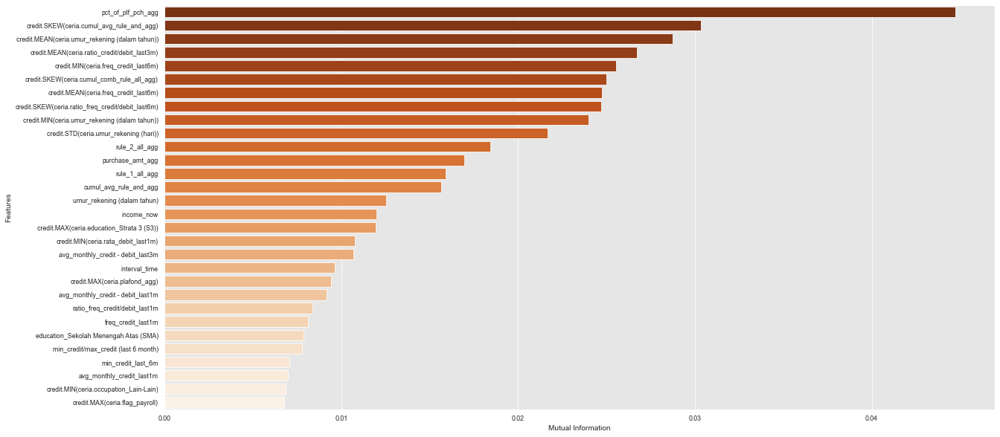

In [55]:
bar_mutual_info()

In [121]:
#SAMPAI SINI


fitur_mi = df_mi.sort_values('mi', ascending=False)['feature'].to_list()
fitur_mi.append('Flag')

NameError: name 'df_mi' is not defined

In [19]:
df_corr_mi = df_train[fitur_mi]
df_corr_new_mi = df_corr_mi.drop(columns='Flag')
correlation_mi = cross_corr_mean(df_corr_new_mi, corr_coeff=0.9, savefile=1)
df_corr_new_mi['Flag'] = df_corr_mi['Flag']
df_selected_features_mi = df_corr_new_mi.drop(columns=correlation_mi)
selected_features_mi = df_selected_features_mi.columns.to_list()[:-1]
selected_features_mi

KeyError: "['pendidikan_0', 'jenis_pekerjaan_UNDEFINED', 'jenis_pekerjaan_IBU RUMAH TANGGA', 'Jenis_Kelamin_Pria', 'jenis_pekerjaan_PEGAWAI BUMN', 'jenis_pekerjaan_PEDAGANG', 'jenis_pekerjaan_PEGAWAI NEGERI SIPIL', 'jenis_pekerjaan_PEGAWAI SWASTA', 'jenis_pekerjaan_PENGANGGUR/BELUM BEKERJA/PENCARI KERJA', 'pendidikan_SMA', 'pendidikan_MASTER', 'pendidikan_DOKTORAL', 'jenis_pekerjaan_WIRASWASTA', 'jenis_pekerjaan_PENSIUNAN', 'pendidikan_UNDEFINED', 'jenis_pekerjaan_TECHNICAL / ENGINEERING-LAINNYA', 'pendidikan_SARJANA', 'jenis_pekerjaan_Lainnya', 'Jenis_Kelamin_Wanita', 'pendidikan_SD/SMP'] not in index"

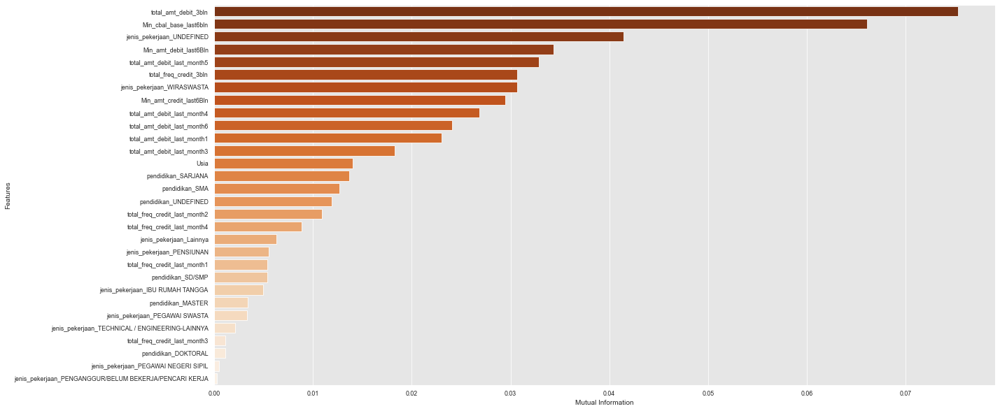

In [118]:
bar_mutual_info()